# Time series analysis and predictions on London Bike Hiring Dataset
London is a crowdy city. An about bike hiring/ bike traffic on daily basis can benifit many industries.

## Aims: 
   ### Doing an exploratory analyis.
   ### Data storytelling: Finding differnt patterns especially seasonality 
   ### Predict the number of bike hire on a particular day/month/year in London. For example predict how the bicycle traffic will look like on a month or a particular location.


I have also visualized the data in Tableu (https://public.tableau.com/app/profile/raju.roy#!/). 
If you want to get an overal idea, such as where most crowdy stations located. At which month or day more people hire bikes, you can interactively select features and the dashboard will show you the trends. 


The first dataset was downloaded from publicly available dataset 'London Bicycle Hire' in Bigquery.

(https://console.cloud.google.com/marketplace/product/greater-london-authority/london-bicycles?project=fit-shift-332509)
This data contains the number of hires of London's Santander Cycle Hire Scheme from 01/2015 to 06/2017. Data includes start and stop timestamps, geographical location of the station names and ride duration.
This is a big dataset and it was downloaded by chunks and added together. Also the start and end dates are already converted to date-time datatype  and added as new columns before importing here.

The second dataset was downloaded from London data store (https://data.london.gov.uk/dataset/number-bicycle-hires) which contains the daily number of bicycle hire from 2010 to present.




## Install some libraries that you might not have

In [1]:
#!pip install pandas

In [2]:
#pip install pandarallel

In [3]:
#!pip install pandas-profiling

In [ ]:
# for reading parquet file
!pip install pyarrow 

In [ ]:
#for pandas profiling
!pip install ipywidgets

In [6]:
!jupyter nbextension enable --py widgetsnbextension


Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [ ]:
!pip install seaborn

In [ ]:
!pip install hvplot

In [9]:
#!pip install channels

In [ ]:
! conda install -c conda-forge mamba -y # for facebook prophet

In [ ]:
!mamba install -c conda-forge prophet -y

In [ ]:
! pip install install openpyxl

In [ ]:
! pip install plotly

In [ ]:
# To bring holidays in your dataset
!pip install holidays

## Import libraries

In [14]:
#import libraries
import pandas as pd
from datetime import datetime as dt, timedelta
#from pandas_profiling import ProfileReport

In [15]:
# for tracking the time
#from tqdm.notebook import trange, tqdm

In [16]:
import matplotlib.pyplot as plt

In [17]:
import seaborn as sns

In [18]:
import numpy as np
import hvplot.pandas

In [19]:
import holidays

In [20]:
from datetime import date

## Read the data

In [21]:
df = pd.read_parquet('/storage/huge_raw_bikeshare_df.parq').reset_index(drop = True)

In [22]:
stations = pd.read_csv('cycle_stations.csv')

In [48]:
stations.head()

,id,installed,latitude,locked,longitude,name,bikes_count,docks_count,nbEmptyDocks,temporary,terminal_name,install_date,removal_date
0,3,True,51.521284,False,-0.084606,"Christopher Street, Liverpool Street",30,32,0,False,1012,2010-07-04,NaN
1,32,True,51.524696,False,-0.084439,"Leonard Circus , Shoreditch",42,43,0,False,1020,2010-07-07,NaN
2,228,True,51.507425,False,-0.134621,"St. James's Square, St. James's",40,40,0,False,1067,2010-07-20,NaN
3,229,True,51.506543,False,-0.123180,"Whitehall Place, Strand",45,46,0,False,1151,2010-07-20,NaN
4,494,True,51.501960,False,-0.016251,"South Quay East, Canary Wharf",35,36,0,False,200233,2012-01-24,NaN


#### Data Cleaning

##### Initial exploration

In [23]:
df.head()


,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name,end_station_logical_terminal,start_station_logical_terminal,end_station_priority_id,start_date_as_dt,end_date_as_dt
0,40830511.0,960.0,5744.0,2015-01-27 09:56:00 UTC,514.0,"Portman Square, Marylebone",2015-01-27 09:40:00 UTC,341.0,"Craven Street, Strand",NaN,NaN,NaN,2015-01-27 09:40:00+00:00,2015-01-27 09:56:00+00:00
1,42510519.0,1200.0,7893.0,2015-04-11 19:07:00 UTC,569.0,"Pitfield Street Central, Hoxton",2015-04-11 18:47:00 UTC,313.0,"Wells Street, Fitzrovia",NaN,NaN,NaN,2015-04-11 18:47:00+00:00,2015-04-11 19:07:00+00:00
2,40443643.0,360.0,238.0,2015-01-09 08:29:00 UTC,279.0,"North Wharf Road, Paddington",2015-01-09 08:23:00 UTC,182.0,"Bell Street , Marylebone",NaN,NaN,NaN,2015-01-09 08:23:00+00:00,2015-01-09 08:29:00+00:00
3,45016880.0,1260.0,6823.0,2015-06-28 11:05:00 UTC,95.0,"Aldersgate Street, Barbican",2015-06-28 10:44:00 UTC,518.0,"Antill Road, Mile End",NaN,NaN,NaN,2015-06-28 10:44:00+00:00,2015-06-28 11:05:00+00:00
4,44219013.0,1140.0,12084.0,2015-06-06 07:40:00 UTC,404.0,"Palace Gate, Kensington Gardens",2015-06-06 07:21:00 UTC,406.0,"Speakers' Corner 2, Hyde Park",NaN,NaN,NaN,2015-06-06 07:21:00+00:00,2015-06-06 07:40:00+00:00


In [24]:
df.shape

(24369201, 14)

let's drop some corrupted data. I like where start date is higher then end date, that's sure the data is corrupted and if we look at durations of the trip it does not match

In [25]:
df[df.start_date_as_dt >= df.end_date_as_dt]

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name,end_station_logical_terminal,start_station_logical_terminal,end_station_priority_id,start_date_as_dt,end_date_as_dt
239,42878297.0,0.0,864.0,2015-04-23 09:01:00 UTC,14.0,"Belgrove Street , King's Cross",2015-04-23 09:01:00 UTC,14.0,"Belgrove Street , King's Cross",NaN,NaN,NaN,2015-04-23 09:01:00+00:00,2015-04-23 09:01:00+00:00
284,42333348.0,0.0,9897.0,2015-04-06 10:06:00 UTC,43.0,"Crawford Street, Marylebone",2015-04-06 10:06:00 UTC,43.0,"Crawford Street, Marylebone",NaN,NaN,NaN,2015-04-06 10:06:00+00:00,2015-04-06 10:06:00+00:00
986,41515911.0,0.0,839.0,2015-03-01 16:04:00 UTC,271.0,"London Zoo, Regents Park",2015-03-01 16:04:00 UTC,271.0,"London Zoo, Regents Park",NaN,NaN,NaN,2015-03-01 16:04:00+00:00,2015-03-01 16:04:00+00:00
1427,42200682.0,0.0,4852.0,2015-03-30 14:50:00 UTC,580.0,"Doddington Grove, Kennington",2015-03-30 14:50:00 UTC,580.0,"Doddington Grove, Kennington",NaN,NaN,NaN,2015-03-30 14:50:00+00:00,2015-03-30 14:50:00+00:00
1798,41290632.0,0.0,4444.0,2015-02-18 13:58:00 UTC,733.0,"Park Lane, Mayfair",2015-02-18 13:58:00 UTC,733.0,"Park Lane, Mayfair",NaN,NaN,NaN,2015-02-18 13:58:00+00:00,2015-02-18 13:58:00+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24315316,63015924.0,1440.0,3979.0,2017-03-12 03:06:00 UTC,646.0,"Buckingham Gate, Westminster",2017-03-12 03:42:00 UTC,109.0,"Soho Square , Soho",NaN,NaN,NaN,2017-03-12 03:42:00+00:00,2017-03-12 03:06:00+00:00
24320381,62931864.0,0.0,6632.0,2017-03-09 11:13:00 UTC,816.0,"Here East South, Queen Elizabeth Olympic Park",2017-03-09 11:13:00 UTC,816.0,"Here East South, Queen Elizabeth Olympic Park",NaN,NaN,NaN,2017-03-09 11:13:00+00:00,2017-03-09 11:13:00+00:00
24341300,61666924.0,0.0,6901.0,2017-01-13 17:39:00 UTC,480.0,"Flamborough Street, Limehouse",2017-01-13 17:39:00 UTC,480.0,"Flamborough Street, Limehouse",NaN,NaN,NaN,2017-01-13 17:39:00+00:00,2017-01-13 17:39:00+00:00
24350326,63015926.0,1440.0,1775.0,2017-03-12 03:06:00 UTC,646.0,"Buckingham Gate, Westminster",2017-03-12 03:42:00 UTC,109.0,"Soho Square , Soho",NaN,NaN,NaN,2017-03-12 03:42:00+00:00,2017-03-12 03:06:00+00:00


In [26]:
df[df.start_date_as_dt >= df.end_date_as_dt].count()

rental_id                         34602
duration                          34602
bike_id                           34602
end_date                          34602
end_station_id                    34593
end_station_name                  34602
start_date                        34602
start_station_id                  34593
start_station_name                34602
end_station_logical_terminal          9
start_station_logical_terminal        9
end_station_priority_id               9
start_date_as_dt                  34602
end_date_as_dt                    34602
dtype: int64

In [27]:
df.drop(df[df.start_date_as_dt >= df.end_date_as_dt].index, inplace = True)

In [28]:
df.shape

(24334599, 14)

In [29]:
df[df.duration <0]


,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name,end_station_logical_terminal,start_station_logical_terminal,end_station_priority_id,start_date_as_dt,end_date_as_dt


In [30]:
df.start_date_as_dt.max()

Timestamp('2017-06-13 23:59:00+0000', tz='UTC')

In [31]:
df.start_date_as_dt.min()


Timestamp('2015-01-04 00:00:00+0000', tz='UTC')

In [32]:
df.shape


(24334599, 14)

In [33]:
df.dtypes


rental_id                                     float64
duration                                      float64
bike_id                                       float64
end_date                                       object
end_station_id                                float64
end_station_name                               object
start_date                                     object
start_station_id                              float64
start_station_name                             object
end_station_logical_terminal                  float64
start_station_logical_terminal                float64
end_station_priority_id                       float64
start_date_as_dt                  datetime64[ns, UTC]
end_date_as_dt                    datetime64[ns, UTC]
dtype: object

In [34]:
# This code takes time...
#profile = ProfileReport(df, title="Pandas Profiling Report", minimal=True) # for large dataset minimal = True

In [35]:
df.columns

Index(['rental_id', 'duration', 'bike_id', 'end_date', 'end_station_id',
       'end_station_name', 'start_date', 'start_station_id',
       'start_station_name', 'end_station_logical_terminal',
       'start_station_logical_terminal', 'end_station_priority_id',
       'start_date_as_dt', 'end_date_as_dt'],
      dtype='object')

In [36]:
# This code will generate an output html file in this directory. Click on that file to get a summery of the data
#profile.to_file("output.html")


From profile report we see that start_station_id and endstatiuon_id 
have missing values but the start station name and end station name have 
no missiong values . So we will use start and end station names instead of their ids. 
end_station_logical_terminal, start_station_logical_terminal, end_station_priority_id are full of nans,
so we avoid them for present analyis. 

In [37]:
df.head()

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name,end_station_logical_terminal,start_station_logical_terminal,end_station_priority_id,start_date_as_dt,end_date_as_dt
0,40830511.0,960.0,5744.0,2015-01-27 09:56:00 UTC,514.0,"Portman Square, Marylebone",2015-01-27 09:40:00 UTC,341.0,"Craven Street, Strand",NaN,NaN,NaN,2015-01-27 09:40:00+00:00,2015-01-27 09:56:00+00:00
1,42510519.0,1200.0,7893.0,2015-04-11 19:07:00 UTC,569.0,"Pitfield Street Central, Hoxton",2015-04-11 18:47:00 UTC,313.0,"Wells Street, Fitzrovia",NaN,NaN,NaN,2015-04-11 18:47:00+00:00,2015-04-11 19:07:00+00:00
2,40443643.0,360.0,238.0,2015-01-09 08:29:00 UTC,279.0,"North Wharf Road, Paddington",2015-01-09 08:23:00 UTC,182.0,"Bell Street , Marylebone",NaN,NaN,NaN,2015-01-09 08:23:00+00:00,2015-01-09 08:29:00+00:00
3,45016880.0,1260.0,6823.0,2015-06-28 11:05:00 UTC,95.0,"Aldersgate Street, Barbican",2015-06-28 10:44:00 UTC,518.0,"Antill Road, Mile End",NaN,NaN,NaN,2015-06-28 10:44:00+00:00,2015-06-28 11:05:00+00:00
4,44219013.0,1140.0,12084.0,2015-06-06 07:40:00 UTC,404.0,"Palace Gate, Kensington Gardens",2015-06-06 07:21:00 UTC,406.0,"Speakers' Corner 2, Hyde Park",NaN,NaN,NaN,2015-06-06 07:21:00+00:00,2015-06-06 07:40:00+00:00


In [38]:
df.dtypes

rental_id                                     float64
duration                                      float64
bike_id                                       float64
end_date                                       object
end_station_id                                float64
end_station_name                               object
start_date                                     object
start_station_id                              float64
start_station_name                             object
end_station_logical_terminal                  float64
start_station_logical_terminal                float64
end_station_priority_id                       float64
start_date_as_dt                  datetime64[ns, UTC]
end_date_as_dt                    datetime64[ns, UTC]
dtype: object

In [39]:
df.shape

(24334599, 14)

In [40]:
df.head()

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name,end_station_logical_terminal,start_station_logical_terminal,end_station_priority_id,start_date_as_dt,end_date_as_dt
0,40830511.0,960.0,5744.0,2015-01-27 09:56:00 UTC,514.0,"Portman Square, Marylebone",2015-01-27 09:40:00 UTC,341.0,"Craven Street, Strand",NaN,NaN,NaN,2015-01-27 09:40:00+00:00,2015-01-27 09:56:00+00:00
1,42510519.0,1200.0,7893.0,2015-04-11 19:07:00 UTC,569.0,"Pitfield Street Central, Hoxton",2015-04-11 18:47:00 UTC,313.0,"Wells Street, Fitzrovia",NaN,NaN,NaN,2015-04-11 18:47:00+00:00,2015-04-11 19:07:00+00:00
2,40443643.0,360.0,238.0,2015-01-09 08:29:00 UTC,279.0,"North Wharf Road, Paddington",2015-01-09 08:23:00 UTC,182.0,"Bell Street , Marylebone",NaN,NaN,NaN,2015-01-09 08:23:00+00:00,2015-01-09 08:29:00+00:00
3,45016880.0,1260.0,6823.0,2015-06-28 11:05:00 UTC,95.0,"Aldersgate Street, Barbican",2015-06-28 10:44:00 UTC,518.0,"Antill Road, Mile End",NaN,NaN,NaN,2015-06-28 10:44:00+00:00,2015-06-28 11:05:00+00:00
4,44219013.0,1140.0,12084.0,2015-06-06 07:40:00 UTC,404.0,"Palace Gate, Kensington Gardens",2015-06-06 07:21:00 UTC,406.0,"Speakers' Corner 2, Hyde Park",NaN,NaN,NaN,2015-06-06 07:21:00+00:00,2015-06-06 07:40:00+00:00


The duration seems like in seconds. To have a better visualizations we convert in to minutes

In [41]:
df['duration_in_minutes'] = df.duration/60

In [42]:
df['duration_in_hours'] = df.duration/3600

In [43]:
df.head()

,rental_id,duration,bike_id,end_date,end_station_id,end_station_name,start_date,start_station_id,start_station_name,end_station_logical_terminal,start_station_logical_terminal,end_station_priority_id,start_date_as_dt,end_date_as_dt,duration_in_minutes,duration_in_hours
0,40830511.0,960.0,5744.0,2015-01-27 09:56:00 UTC,514.0,"Portman Square, Marylebone",2015-01-27 09:40:00 UTC,341.0,"Craven Street, Strand",NaN,NaN,NaN,2015-01-27 09:40:00+00:00,2015-01-27 09:56:00+00:00,16.0,0.266667
1,42510519.0,1200.0,7893.0,2015-04-11 19:07:00 UTC,569.0,"Pitfield Street Central, Hoxton",2015-04-11 18:47:00 UTC,313.0,"Wells Street, Fitzrovia",NaN,NaN,NaN,2015-04-11 18:47:00+00:00,2015-04-11 19:07:00+00:00,20.0,0.333333
2,40443643.0,360.0,238.0,2015-01-09 08:29:00 UTC,279.0,"North Wharf Road, Paddington",2015-01-09 08:23:00 UTC,182.0,"Bell Street , Marylebone",NaN,NaN,NaN,2015-01-09 08:23:00+00:00,2015-01-09 08:29:00+00:00,6.0,0.100000
3,45016880.0,1260.0,6823.0,2015-06-28 11:05:00 UTC,95.0,"Aldersgate Street, Barbican",2015-06-28 10:44:00 UTC,518.0,"Antill Road, Mile End",NaN,NaN,NaN,2015-06-28 10:44:00+00:00,2015-06-28 11:05:00+00:00,21.0,0.350000
4,44219013.0,1140.0,12084.0,2015-06-06 07:40:00 UTC,404.0,"Palace Gate, Kensington Gardens",2015-06-06 07:21:00 UTC,406.0,"Speakers' Corner 2, Hyde Park",NaN,NaN,NaN,2015-06-06 07:21:00+00:00,2015-06-06 07:40:00+00:00,19.0,0.316667


In [44]:
df = df[['rental_id', 'duration','duration_in_minutes','duration_in_hours',
       'end_station_name', 'start_date_as_dt' ,'end_date_as_dt',  
       'start_station_name']]

df.rename(columns={"start_date_as_dt": "start_date", "end_date_as_dt": "end_date"}, inplace = True)
df.head()

,rental_id,duration,duration_in_minutes,duration_in_hours,end_station_name,start_date,end_date,start_station_name
0,40830511.0,960.0,16.0,0.266667,"Portman Square, Marylebone",2015-01-27 09:40:00+00:00,2015-01-27 09:56:00+00:00,"Craven Street, Strand"
1,42510519.0,1200.0,20.0,0.333333,"Pitfield Street Central, Hoxton",2015-04-11 18:47:00+00:00,2015-04-11 19:07:00+00:00,"Wells Street, Fitzrovia"
2,40443643.0,360.0,6.0,0.100000,"North Wharf Road, Paddington",2015-01-09 08:23:00+00:00,2015-01-09 08:29:00+00:00,"Bell Street , Marylebone"
3,45016880.0,1260.0,21.0,0.350000,"Aldersgate Street, Barbican",2015-06-28 10:44:00+00:00,2015-06-28 11:05:00+00:00,"Antill Road, Mile End"
4,44219013.0,1140.0,19.0,0.316667,"Palace Gate, Kensington Gardens",2015-06-06 07:21:00+00:00,2015-06-06 07:40:00+00:00,"Speakers' Corner 2, Hyde Park"


In [45]:
df['duration_in_days'] = df.duration/(3600*24)

In [46]:
df[df.duration_in_days > 30]

,rental_id,duration,duration_in_minutes,duration_in_hours,end_station_name,start_date,end_date,start_station_name,duration_in_days
1143340,43165104.0,2640120.0,44002.0,733.366667,"Nesham Street, Wapping",2015-05-03 07:21:00+00:00,2015-06-02 20:43:00+00:00,"Dunston Road , Haggerston",30.556944
10660810,52741903.0,2597400.0,43290.0,721.500000,"Speakers' Corner 2, Hyde Park",2016-04-08 15:20:00+00:00,2016-05-08 16:50:00+00:00,"Black Lion Gate, Kensington Gardens",30.062500
13362893,52644102.0,2674020.0,44567.0,742.783333,"Ada Street, Hackney Central",2016-04-04 20:17:00+00:00,2016-05-05 19:04:00+00:00,"Bethnal Green Road, Shoreditch",30.949306


# Data Analysis

In [47]:
df['duration_in_hours'] = df.duration_in_minutes/60

In [259]:
df.duration_in_minutes.value_counts()

8.0        1195340
9.0        1193066
10.0       1173322
7.0        1173057
11.0       1135978
            ...   
3602.0           1
13985.0          1
9419.0           1
3225.0           1
14579.0          1
Name: duration_in_minutes, Length: 6913, dtype: int64

The data is big for the machines to analyze. so we do the analysis step by step. first grab the data only for a random date 27_01_2015. we see it already contains 25000 rows. Just for a single day!

In [49]:
df_27_01_2015 = df[(df.start_date.dt.year == 2015) & (df.start_date.dt.month == 1) & (df.start_date.dt.day == 27)].reset_index()



In [50]:
df_27_01_2015

,index,rental_id,duration,duration_in_minutes,duration_in_hours,end_station_name,start_date,end_date,start_station_name,duration_in_days
0,0,40830511.0,960.0,16.0,0.266667,"Portman Square, Marylebone",2015-01-27 09:40:00+00:00,2015-01-27 09:56:00+00:00,"Craven Street, Strand",0.011111
1,32,40848076.0,660.0,11.0,0.183333,"Battersea Church Road, Battersea",2015-01-27 23:41:00+00:00,2015-01-27 23:52:00+00:00,"Exhibition Road Museums, Knightsbridge",0.007639
2,146,40841725.0,180.0,3.0,0.050000,"Bath Street, St. Luke's",2015-01-27 18:12:00+00:00,2015-01-27 18:15:00+00:00,"Bunhill Row, Moorgate",0.002083
3,357,40833968.0,780.0,13.0,0.216667,"Wormwood Street, Liverpool Street",2015-01-27 13:11:00+00:00,2015-01-27 13:24:00+00:00,"Belvedere Road, South Bank",0.009028
4,367,40826799.0,240.0,4.0,0.066667,"Finsbury Square , Moorgate",2015-01-27 08:31:00+00:00,2015-01-27 08:35:00+00:00,"Bath Street, St. Luke's",0.002778
...,...,...,...,...,...,...,...,...,...,...
24920,4549390,40842569.0,2100.0,35.0,0.583333,"Cephas Street, Bethnal Green",2015-01-27 18:29:00+00:00,2015-01-27 19:04:00+00:00,"Crinan Street, King's Cross",0.024306
24921,4549391,40825838.0,900.0,15.0,0.250000,"Stonecutter Street, Holborn",2015-01-27 08:17:00+00:00,2015-01-27 08:32:00+00:00,"Pitfield Street (North),Hoxton",0.010417
24922,4549506,40828097.0,300.0,5.0,0.083333,"Great Suffolk Street, The Borough",2015-01-27 08:48:00+00:00,2015-01-27 08:53:00+00:00,"Bricklayers Arms, Borough",0.003472
24923,4549689,40843797.0,8460.0,141.0,2.350000,"Fulham Park Road, Fulham",2015-01-27 18:59:00+00:00,2015-01-27 21:20:00+00:00,"Poured Lines, Bankside",0.097917


In [51]:
df_27_01_2015.shape

(24925, 10)

In [52]:
df_27_01_2015.to_csv('df_27_01_2015.csv')

Let's merge this dataframe with cycle stations to get co-ordinates of start and end stations.
Therefore first merging is based on start station names and second one is based on end station names

In [53]:
df1 = df_27_01_2015.merge(stations, how = 'inner', left_on = 'start_station_name', right_on = 'name', suffixes=('_x', '_y'))

In [54]:
df1.columns

Index(['index', 'rental_id', 'duration', 'duration_in_minutes',
       'duration_in_hours', 'end_station_name', 'start_date', 'end_date',
       'start_station_name', 'duration_in_days', 'id', 'installed', 'latitude',
       'locked', 'longitude', 'name', 'bikes_count', 'docks_count',
       'nbEmptyDocks', 'temporary', 'terminal_name', 'install_date',
       'removal_date'],
      dtype='object')

In [55]:
df1 = df1[['rental_id', 'duration_in_minutes', 'end_station_name',
        'start_station_name',
       'latitude','longitude']]

In [56]:
df1.rename(columns= {'latitude': 'start_latitude', 'longitude': 'start_longitude'}, inplace= True)

In [57]:
df1

,rental_id,duration_in_minutes,end_station_name,start_station_name,start_latitude,start_longitude
0,40830511.0,16.0,"Portman Square, Marylebone","Craven Street, Strand",51.508103,-0.126021
1,40847331.0,31.0,"Esmond Street, Putney","Craven Street, Strand",51.508103,-0.126021
2,40824165.0,17.0,"Elizabeth Bridge, Victoria","Craven Street, Strand",51.508103,-0.126021
3,40831088.0,10.0,"Seville Street, Knightsbridge","Craven Street, Strand",51.508103,-0.126021
4,40831991.0,9.0,"Clarges Street, West End","Craven Street, Strand",51.508103,-0.126021
...,...,...,...,...,...,...
22264,40839197.0,15.0,"Jewry Street, Aldgate","Ackroyd Drive, Bow",51.520398,-0.026768
22265,40831893.0,17.0,"Brushfield Street, Liverpool Street","Ackroyd Drive, Bow",51.520398,-0.026768
22266,40829309.0,45.0,"Stainsby Road , Poplar","Ackroyd Drive, Bow",51.520398,-0.026768
22267,40834625.0,21.0,"Brick Lane Market, Shoreditch","Ackroyd Drive, Bow",51.520398,-0.026768


now we do the same for end stations

In [58]:
df_with_coordinates = df1.merge(stations, how = 'inner', left_on = 'end_station_name', right_on = 'name', suffixes=('_x', '_y'))

In [59]:
df_with_coordinates.columns

Index(['rental_id', 'duration_in_minutes', 'end_station_name',
       'start_station_name', 'start_latitude', 'start_longitude', 'id',
       'installed', 'latitude', 'locked', 'longitude', 'name', 'bikes_count',
       'docks_count', 'nbEmptyDocks', 'temporary', 'terminal_name',
       'install_date', 'removal_date'],
      dtype='object')

In [60]:
df_with_coordinates = df_with_coordinates[['rental_id', 'duration_in_minutes', 'end_station_name',
       'start_station_name', 'start_latitude', 'start_longitude',  'latitude', 'longitude']]

In [61]:
df_with_coordinates.rename(columns= {'latitude': 'end_latitude', 'longitude': 'end_longitude'}, inplace= True)


In [62]:
df_with_coordinates

,rental_id,duration_in_minutes,end_station_name,start_station_name,start_latitude,start_longitude,end_latitude,end_longitude
0,40830511.0,16.0,"Portman Square, Marylebone","Craven Street, Strand",51.508103,-0.126021,51.516204,-0.155525
1,40830727.0,14.0,"Portman Square, Marylebone","Albert Gate, Hyde Park",51.502954,-0.158456,51.516204,-0.155525
2,40825520.0,43.0,"Portman Square, Marylebone","Pritchard's Road, Bethnal Green",51.532091,-0.061420,51.516204,-0.155525
3,40825295.0,16.0,"Portman Square, Marylebone","Belgrove Street , King's Cross",51.529944,-0.123617,51.516204,-0.155525
4,40847378.0,14.0,"Portman Square, Marylebone","Eversholt Street , Camden Town",51.533005,-0.136793,51.516204,-0.155525
...,...,...,...,...,...,...,...,...
19992,40822936.0,5.0,"Queensdale Road, Shepherd's Bush","Blenheim Crescent, Ladbroke Grove",51.515108,-0.208565,51.506590,-0.216104
19993,40846173.0,9.0,"Queensdale Road, Shepherd's Bush","Clarendon Road, Avondale",51.513230,-0.211594,51.506590,-0.216104
19994,40846188.0,7.0,"Queensdale Road, Shepherd's Bush","Clarendon Road, Avondale",51.513230,-0.211594,51.506590,-0.216104
19995,40837936.0,4.0,"Aberfeldy Street, Poplar","Naval Row, Blackwall",51.508981,-0.006990,51.513548,-0.005659


#### Suppose we want to know most popular routes on that day

In [63]:
routes = pd.DataFrame(df_with_coordinates.groupby(['start_station_name','end_station_name']).size().sort_values(ascending = False).reset_index())

In [64]:
routes.columns = ['start_station','end_station', 'number of times this route used']

In [65]:
# 10 most popular routes
routes.head(10)

,start_station,end_station,number of times this route used
0,"Hyde Park Corner, Hyde Park","Hyde Park Corner, Hyde Park",18
1,"Waterloo Station 3, Waterloo","New Globe Walk, Bankside",10
2,"Holborn Circus, Holborn","Belgrove Street , King's Cross",10
3,"Belgrove Street , King's Cross","Holborn Circus, Holborn",10
4,"Albert Gate, Hyde Park","Albert Gate, Hyde Park",9
5,"Waterloo Station 3, Waterloo","Finsbury Circus, Liverpool Street",9
6,"Notting Hill Gate Station, Notting Hill","All Saints Church, Portobello",9
7,"Newgate Street , St. Paul's","Waterloo Station 3, Waterloo",9
8,"Parsons Green Station, Parsons Green","St. Peter's Terrace, Fulham",9
9,"Waterloo Station 3, Waterloo","Stonecutter Street, Holborn",9


#### Let's see most popular start stations in 27/01/2015

Top 10 start stations


In [66]:
station_groupby = pd.DataFrame(df_27_01_2015.groupby(['start_station_name']).count().sort_values(by = 'rental_id', ascending = False).reset_index())


In [67]:
# To get the co-ordinate of the popular start stations
start_locations = station_groupby.merge(stations, how = 'inner', left_on = 'start_station_name', right_on = 'name', suffixes=('_x', '_y'))


In [68]:
start_locations 

,start_station_name,index,rental_id,duration,duration_in_minutes,duration_in_hours,end_station_name,start_date,end_date,duration_in_days,...,locked,longitude,name,bikes_count,docks_count,nbEmptyDocks,temporary,terminal_name,install_date,removal_date
0,"Waterloo Station 3, Waterloo",324,324,324,324,324,324,324,324,324,...,False,-0.112824,"Waterloo Station 3, Waterloo",16,35,13,False,1072,NaN,NaN
1,"Belgrove Street , King's Cross",304,304,304,304,304,304,304,304,304,...,False,-0.123617,"Belgrove Street , King's Cross",21,48,27,False,1011,2010-07-05,NaN
2,"Waterloo Station 1, Waterloo",206,206,206,206,206,206,206,206,206,...,False,-0.113864,"Waterloo Station 1, Waterloo",22,36,11,False,2696,2010-12-07,NaN
3,"Wormwood Street, Liverpool Street",191,191,191,191,191,191,191,191,191,...,False,-0.082422,"Wormwood Street, Liverpool Street",12,16,0,False,2587,2010-07-19,NaN
4,"Finsbury Circus, Liverpool Street",175,175,175,175,175,175,175,175,175,...,False,-0.086686,"Finsbury Circus, Liverpool Street",31,33,1,False,984,2010-07-10,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
632,"Holland Park, Kensington",3,3,3,3,3,3,3,3,3,...,False,-0.200742,"Holland Park, Kensington",15,30,15,False,10631,2011-03-02,NaN
633,"New North Road 1, Hoxton",2,2,2,2,2,2,2,2,2,...,False,-0.085603,"New North Road 1, Hoxton",13,22,8,False,1128,2010-07-26,NaN
634,"Lancaster Drive, Blackwall",2,2,2,2,2,2,2,2,2,...,False,-0.008428,"Lancaster Drive, Blackwall",14,27,12,False,200143,NaN,NaN
635,"Hurlingham Park, Parsons Green",1,1,1,1,1,1,1,1,1,...,False,-0.204640,"Hurlingham Park, Parsons Green",11,20,9,False,300098,2014-03-31,NaN


In [69]:
start_locations.columns 

Index(['start_station_name', 'index', 'rental_id', 'duration',
       'duration_in_minutes', 'duration_in_hours', 'end_station_name',
       'start_date', 'end_date', 'duration_in_days', 'id', 'installed',
       'latitude', 'locked', 'longitude', 'name', 'bikes_count', 'docks_count',
       'nbEmptyDocks', 'temporary', 'terminal_name', 'install_date',
       'removal_date'],
      dtype='object')

In [70]:
start_location_coordinates = start_locations[['start_station_name','rental_id', 'latitude','longitude']]

In [71]:
start_location_coordinates.rename(columns ={"rental_id" : "Number of rides"}, inplace = True)

/opt/conda/envs/rapids/lib/python3.7/site-packages/pandas/core/frame.py:4449: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [72]:
start_location_coordinates

,start_station_name,Number of rides,latitude,longitude
0,"Waterloo Station 3, Waterloo",324,51.503792,-0.112824
1,"Belgrove Street , King's Cross",304,51.529944,-0.123617
2,"Waterloo Station 1, Waterloo",206,51.504028,-0.113864
3,"Wormwood Street, Liverpool Street",191,51.516155,-0.082422
4,"Finsbury Circus, Liverpool Street",175,51.517075,-0.086686
...,...,...,...,...
632,"Holland Park, Kensington",3,51.502319,-0.200742
633,"New North Road 1, Hoxton",2,51.530950,-0.085603
634,"Lancaster Drive, Blackwall",2,51.503143,-0.008428
635,"Hurlingham Park, Parsons Green",1,51.470131,-0.204640


In [73]:
start_location_coordinates.shape

(637, 4)

In [74]:
start_location_coordinates.to_csv('start_location_coordinates.csv',index=False)


In [75]:
station_groupby = station_groupby.head(20)

In [76]:
station_groupby

,start_station_name,index,rental_id,duration,duration_in_minutes,duration_in_hours,end_station_name,start_date,end_date,duration_in_days
0,"Waterloo Station 3, Waterloo",324,324,324,324,324,324,324,324,324
1,"Belgrove Street , King's Cross",304,304,304,304,304,304,304,304,304
2,"Waterloo Station 1, Waterloo",206,206,206,206,206,206,206,206,206
3,"Wormwood Street, Liverpool Street",191,191,191,191,191,191,191,191,191
4,"Finsbury Circus, Liverpool Street",175,175,175,175,175,175,175,175,175
5,"Hop Exchange, The Borough",144,144,144,144,144,144,144,144,144
6,"Queen Street, Bank",135,135,135,135,135,135,135,135,135
7,"Crosswall, Tower",124,124,124,124,124,124,124,124,124
8,"Moorfields, Moorgate",123,123,123,123,123,123,123,123,123
9,"Brushfield Street, Liverpool Street",120,120,120,120,120,120,120,120,120


Top 10 destination stations

In [77]:
end_station_groupby = pd.DataFrame(df_27_01_2015.groupby(['end_station_name']).count().sort_values(by = 'rental_id', ascending = False).reset_index())

In [78]:
end_station_groupby

,end_station_name,index,rental_id,duration,duration_in_minutes,duration_in_hours,start_date,end_date,start_station_name,duration_in_days
0,"Belgrove Street , King's Cross",297,297,297,297,297,297,297,297,297
1,"Waterloo Station 1, Waterloo",289,289,289,289,289,289,289,289,289
2,"Waterloo Station 3, Waterloo",230,230,230,230,230,230,230,230,230
3,"Wormwood Street, Liverpool Street",198,198,198,198,198,198,198,198,198
4,"Stonecutter Street, Holborn",187,187,187,187,187,187,187,187,187
...,...,...,...,...,...,...,...,...,...,...
737,"Hurlingham Park, Parsons Green",1,1,1,1,1,1,1,1,1
738,"Grant Road West, Clapham Junction",1,1,1,1,1,1,1,1,1
739,"Manfred Road, East Putney",1,1,1,1,1,1,1,1,1
740,"Lord's, St. John's Wood",1,1,1,1,1,1,1,1,1


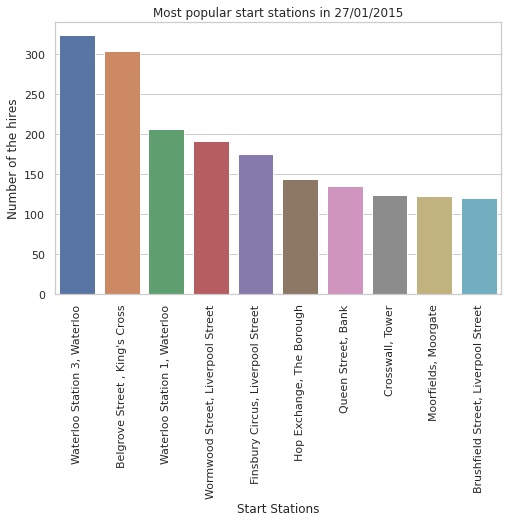

In [79]:
# plot popular start stations
station_groupby = station_groupby.head(10)
import seaborn as sns
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(8, 5)) 
ax = sns.barplot(x="start_station_name", y="rental_id", data=station_groupby)
ax.set(xlabel="Start Stations", ylabel = "Number of the hires", title = 'Most popular start stations in 27/01/2015')
plt.xticks(rotation=90)
plt.show()

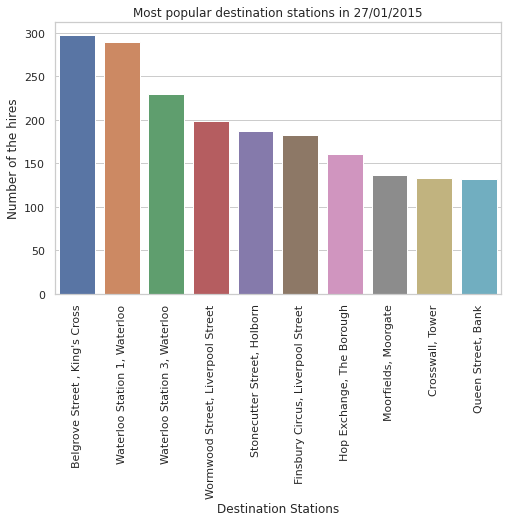

In [80]:
# plot popular end stations
end_station_groupby = end_station_groupby.head(10)
import seaborn as sns
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(8, 5)) 
ax = sns.barplot(x="end_station_name", y="rental_id", data=end_station_groupby)
ax.set(xlabel="Destination Stations", ylabel = "Number of the hires", title = 'Most popular destination stations in 27/01/2015')
plt.xticks(rotation=90)
plt.show()

#### We want to know at which hour most bikes are hired

In [81]:
time_group = pd.DataFrame(df_27_01_2015.groupby(pd.Grouper(key="start_date", freq="1H")).count().reset_index())

In [82]:
time_group = time_group[['start_date', 'rental_id']]

In [83]:
time_group['hours'] = range(24)

In [84]:
time_group.rename(columns ={'rental_id':'number_of_rides'}, inplace = True)

In [85]:
time_group.to_csv('hourly_bike_hiring.csv')

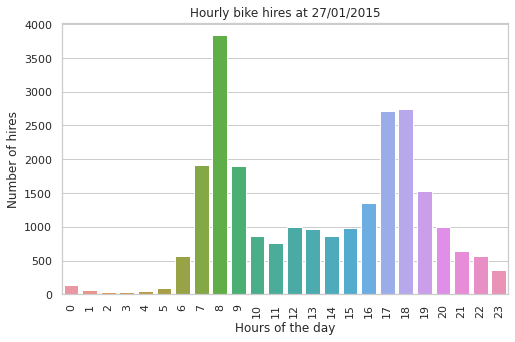

In [87]:
# plot popular end stations
import seaborn as sns
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(8, 5)) 
ax = sns.barplot(x="hours", y='number_of_rides', data=time_group)
ax.set(xlabel="Hours of the day", ylabel = "Number of hires", title = 'Hourly bike hires at 27/01/2015')
plt.xticks(rotation=90)
plt.show()

# Modeling, training and testing with Facebook prophet

#### Prepare the data for facebook prophet, it needs two columns, y and ds. we already aggregated the required data from Bigquery. we will read it and have a look on it first

In [88]:
Bikehiring_by_date = pd.read_csv('Bikehiring_per_day.csv')

In [89]:
Bikehiring_by_date

,number_of_rides,Date
0,9234,2015-01-04
1,20372,2015-01-05
2,20613,2015-01-06
3,22331,2015-01-07
4,15601,2015-01-08
...,...,...
887,33334,2017-06-09
888,36325,2017-06-10
889,32680,2017-06-11
890,35805,2017-06-12


In [90]:
Bikehiring_by_date.columns = ['y', 'ds']

In [91]:
Bikehiring_by_date.dtypes

y      int64
ds    object
dtype: object

Facebook Prophet needs the data in date time format

In [92]:
Bikehiring_by_date.ds =  pd.to_datetime(Bikehiring_by_date.ds)

In [93]:
# check again
Bikehiring_by_date.dtypes

y              int64
ds    datetime64[ns]
dtype: object

In [94]:
#import libraries
from prophet import Prophet

In [95]:
# Initialize the model
model_v1 = Prophet(interval_width= 0.95, daily_seasonality= True)

In [96]:
#fit the model
model_v1.fit(Bikehiring_by_date)

In [97]:
#forcast

In [98]:
future = model_v1.make_future_dataframe(periods = 100, freq = 'D')
forcast = model_v1.predict(future)
forcast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-01-04,12803.407119,624.868598,20109.045115,12803.407119,12803.407119,-1881.173047,-1881.173047,-1881.173047,14324.229093,...,-4536.066535,-4536.066535,-4536.066535,-11669.335606,-11669.335606,-11669.335606,0.0,0.0,0.0,10922.234072
1,2015-01-05,12801.827372,5881.185346,25243.847963,12801.827372,12801.827372,2809.193666,2809.193666,2809.193666,14324.229093,...,-157.300653,-157.300653,-157.300653,-11357.734774,-11357.734774,-11357.734774,0.0,0.0,0.0,15611.021038
2,2015-01-06,12800.247624,8434.806843,28356.025303,12800.247624,12800.247624,5592.191358,5592.191358,5592.191358,14324.229093,...,2274.198009,2274.198009,2274.198009,-11006.235744,-11006.235744,-11006.235744,0.0,0.0,0.0,18392.438982
3,2015-01-07,12798.667876,8766.989962,29465.628079,12798.667876,12798.667876,6007.515553,6007.515553,6007.515553,14324.229093,...,2305.594963,2305.594963,2305.594963,-10622.308504,-10622.308504,-10622.308504,0.0,0.0,0.0,18806.183428
4,2015-01-08,12797.088128,9555.923653,29113.727712,12797.088128,12797.088128,6850.963724,6850.963724,6850.963724,14324.229093,...,2740.595549,2740.595549,2740.595549,-10213.860918,-10213.860918,-10213.860918,0.0,0.0,0.0,19648.051852


In [99]:
forcast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
987,2017-09-17,16313.733481,22054.607628,41109.636405,16233.650712,16394.545056,15243.449821,15243.449821,15243.449821,14324.229093,...,-4536.066535,-4536.066535,-4536.066535,5455.287263,5455.287263,5455.287263,0.0,0.0,0.0,31557.183302
988,2017-09-18,16319.951126,26019.020635,45447.936159,16237.891583,16401.806673,19767.894579,19767.894579,19767.894579,14324.229093,...,-157.300653,-157.300653,-157.300653,5600.966139,5600.966139,5600.966139,0.0,0.0,0.0,36087.845705
989,2017-09-19,16326.168771,28942.243097,49375.652419,16242.997119,16409.163780,22308.256226,22308.256226,22308.256226,14324.229093,...,2274.198009,2274.198009,2274.198009,5709.829125,5709.829125,5709.829125,0.0,0.0,0.0,38634.424997
990,2017-09-20,16332.386416,29050.437649,47958.686488,16248.125302,16416.606282,22409.133693,22409.133693,22409.133693,14324.229093,...,2305.594963,2305.594963,2305.594963,5779.309637,5779.309637,5779.309637,0.0,0.0,0.0,38741.520110
991,2017-09-21,16338.604061,28711.216051,49774.088373,16253.253485,16424.048784,22872.645391,22872.645391,22872.645391,14324.229093,...,2740.595549,2740.595549,2740.595549,5807.820749,5807.820749,5807.820749,0.0,0.0,0.0,39211.249452


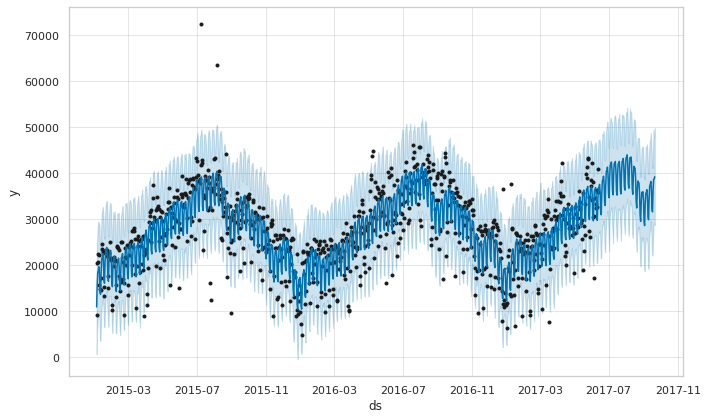

In [100]:
plot1 = model_v1.plot(forcast)

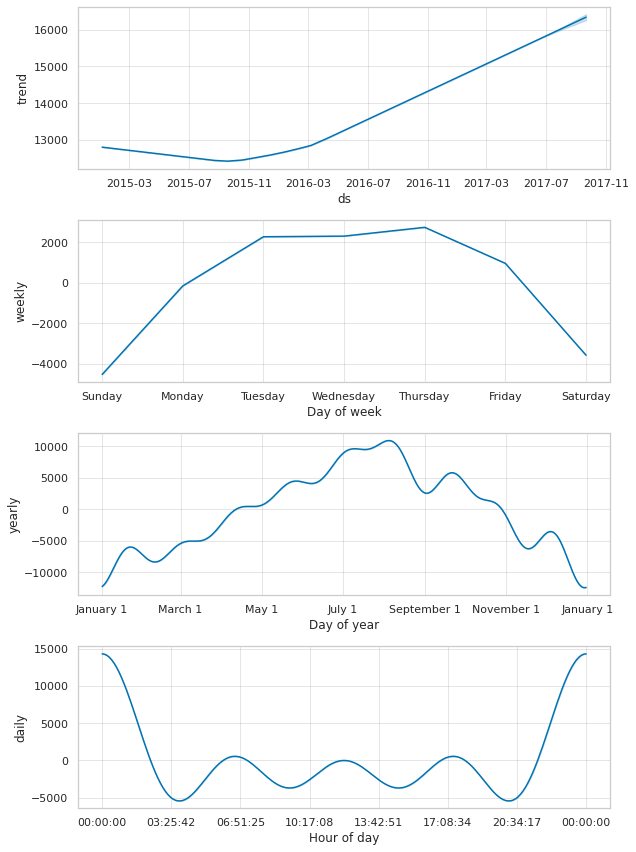

In [101]:
plot2 = model_v1.plot_components(forcast)

##### Now we modify the model and add some new parameters

In [102]:
m = Prophet(yearly_seasonality = True)
m.add_country_holidays(country_name='UK')
m.fit(Bikehiring_by_date)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [103]:
future = m.make_future_dataframe(periods = 100, freq = 'D')
forcast = m.predict(future)
forcast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Battle of the Boyne [Northern Ireland],Battle of the Boyne [Northern Ireland]_lower,Battle of the Boyne [Northern Ireland]_upper,Boxing Day,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-01-04,27202.369963,4282.109748,16908.369079,27202.369963,27202.369963,0.0,0.0,0.0,0.0,...,-4703.148494,-4703.148494,-4703.148494,-11520.897199,-11520.897199,-11520.897199,0.0,0.0,0.0,10978.324271
1,2015-01-05,27201.274518,10366.252168,23293.213815,27201.274518,27201.274518,0.0,0.0,0.0,0.0,...,584.752942,584.752942,584.752942,-11193.652587,-11193.652587,-11193.652587,0.0,0.0,0.0,16592.374873
2,2015-01-06,27200.179073,12393.387786,24388.791626,27200.179073,27200.179073,0.0,0.0,0.0,0.0,...,2222.990399,2222.990399,2222.990399,-10831.733883,-10831.733883,-10831.733883,0.0,0.0,0.0,18591.435588
3,2015-01-07,27199.083628,12756.661321,25489.731864,27199.083628,27199.083628,0.0,0.0,0.0,0.0,...,2140.206059,2140.206059,2140.206059,-10442.806157,-10442.806157,-10442.806157,0.0,0.0,0.0,18896.483530
4,2015-01-08,27197.988183,13652.135329,25943.040221,27197.988183,27197.988183,0.0,0.0,0.0,0.0,...,2556.847281,2556.847281,2556.847281,-10034.851587,-10034.851587,-10034.851587,0.0,0.0,0.0,19719.983877


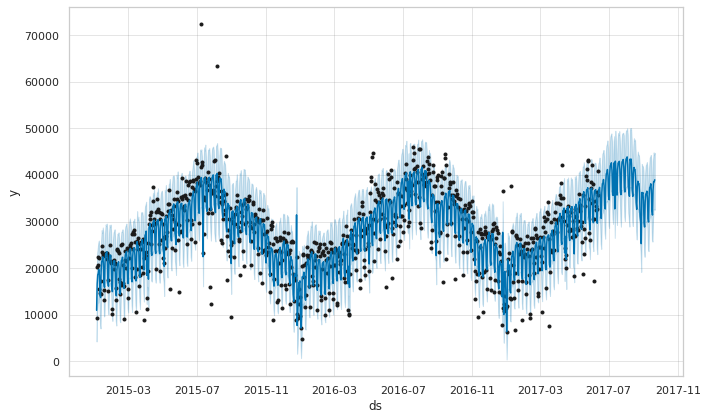

In [104]:
plot3 = m.plot(forcast)

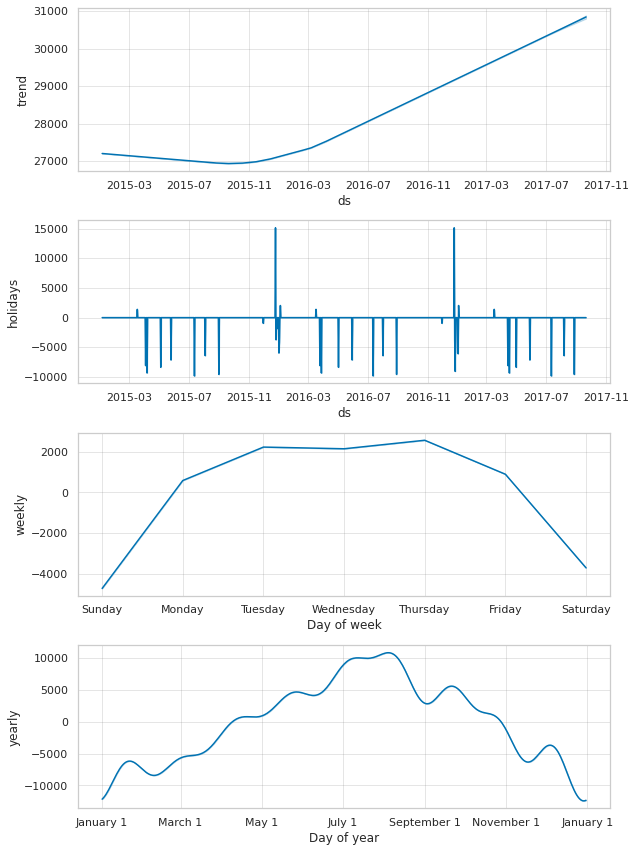

In [105]:
plot3 = m.plot_components(forcast)

In [106]:
# names of the holidays
m.train_holiday_names

0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                Battle of the Boyne [Northern Ireland]
5                        Summer Bank Holiday [Scotland]
6                           St. Andrew's Day [Scotland]
7                                         Christmas Day
8                              Christmas Day (Observed)
9                                           Good Friday
10       Easter Monday [England/Wales/Northern Ireland]
11                                              May Day
12                                  Spring Bank Holiday
13    Late Summer Bank Holiday [England/Wales/Northe...
14                                           Boxing Day
15                            New Year's Day (Observed)
16                                Boxing Day (Observed)
dtype: object

#### Now we look at a dataset that is larger and which contains bike hiring stats from 2010 to now. We plug it into times series analysis


In [108]:
bikehiring_from_2010 = pd.read_excel('bikehiring_from_2010.xlsx')

In [109]:
bikehiring_from_2010

,Day,Number of Bicycle Hires
0,2010-07-30,6897
1,2010-07-31,5564
2,2010-08-01,4303
3,2010-08-02,6642
4,2010-08-03,7966
...,...,...
4076,2021-09-26,45120
4077,2021-09-27,32167
4078,2021-09-28,32539
4079,2021-09-29,39889


In [110]:
bikehiring_from_2010.columns = ['ds', 'y']

In [111]:
bikehiring_from_2010.dtypes

ds    datetime64[ns]
y              int64
dtype: object

In [112]:
m = Prophet(daily_seasonality = True)
m.add_country_holidays(country_name='UK')
m.fit(bikehiring_from_2010)

In [113]:
future = m.make_future_dataframe(periods = 100, freq = 'D')
forcast = m.predict(future)
forcast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Battle of the Boyne [Northern Ireland],Battle of the Boyne [Northern Ireland]_lower,Battle of the Boyne [Northern Ireland]_upper,Boxing Day,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2010-07-30,8268.979744,15514.867368,30890.998323,8268.979744,8268.979744,0.0,0.0,0.0,0.0,...,811.866655,811.866655,811.866655,8186.552626,8186.552626,8186.552626,0.0,0.0,0.0,22818.632182
1,2010-07-31,8286.521420,11581.875978,28205.858909,8286.521420,8286.521420,0.0,0.0,0.0,0.0,...,-2318.658153,-2318.658153,-2318.658153,8116.800792,8116.800792,8116.800792,0.0,0.0,0.0,19635.897216
2,2010-08-01,8304.063097,9869.515850,25801.491523,8304.063097,8304.063097,0.0,0.0,0.0,0.0,...,-4021.951592,-4021.951592,-4021.951592,8040.950352,8040.950352,8040.950352,0.0,0.0,0.0,17874.295013
3,2010-08-02,8321.604774,11878.258967,27857.842278,8321.604774,8321.604774,0.0,0.0,0.0,0.0,...,137.895685,137.895685,137.895685,7957.604152,7957.604152,7957.604152,0.0,0.0,0.0,19581.340782
4,2010-08-03,8339.146450,15790.868774,31700.964697,8339.146450,8339.146450,0.0,0.0,0.0,0.0,...,1794.153580,1794.153580,1794.153580,7865.428728,7865.428728,7865.428728,0.0,0.0,0.0,23549.961915


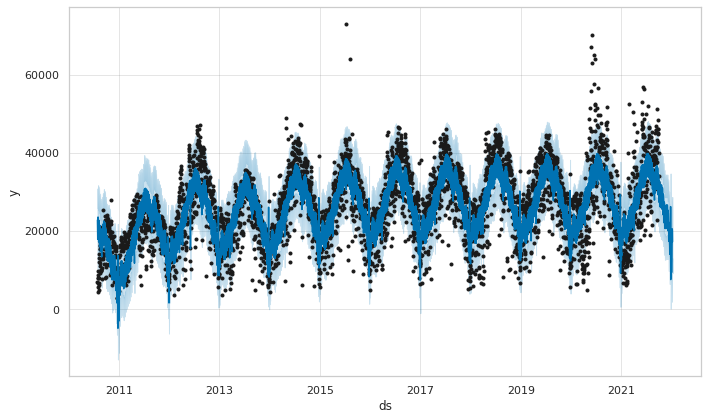

In [114]:
plot5 = m.plot(forcast)

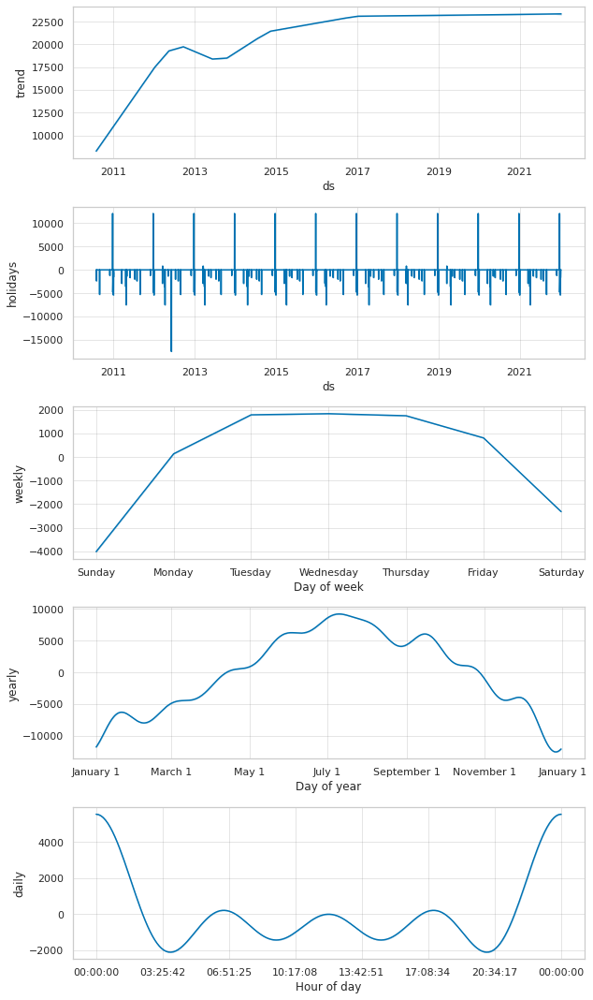

In [115]:
plot6 = m.plot_components(forcast)

### Tune the model with on and off season

In [116]:
def is_nfl_season(ds):
    date = pd.to_datetime(ds)
    return (date.month < 7 or date.month > 3)

In [117]:

bikehiring_from_2010['on_season'] = bikehiring_from_2010['ds'].apply(is_nfl_season)
bikehiring_from_2010['off_season'] = ~bikehiring_from_2010['ds'].apply(is_nfl_season)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


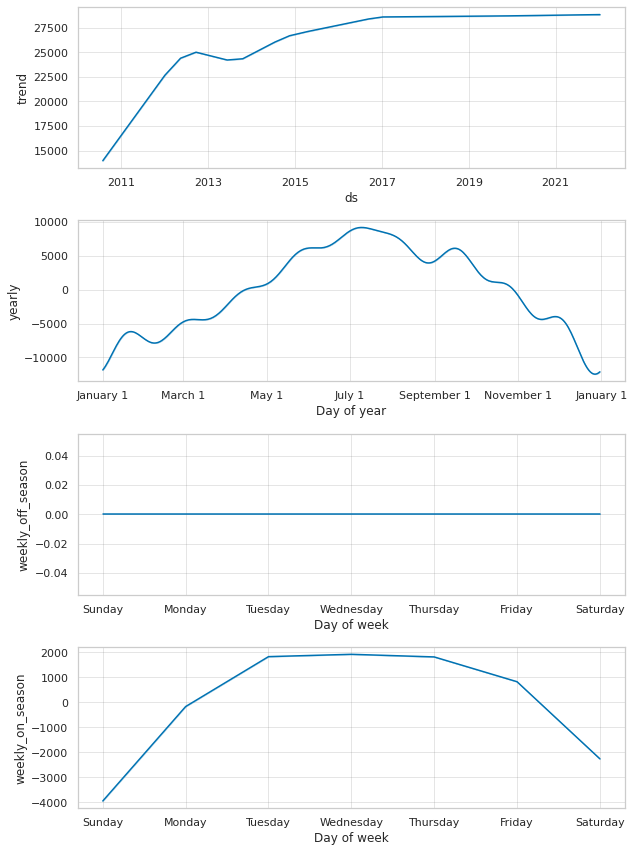

In [118]:
m = Prophet(weekly_seasonality=False)
m.add_seasonality(name='weekly_on_season', period=7, fourier_order=3, condition_name='on_season')
m.add_seasonality(name='weekly_off_season', period=7, fourier_order=3, condition_name='off_season')

future['on_season'] = future['ds'].apply(is_nfl_season)
future['off_season'] = ~future['ds'].apply(is_nfl_season)
forecast = m.fit(bikehiring_from_2010).predict(future)
fig = m.plot_components(forecast)

In [119]:
bikehiring_from_2010

,ds,y,on_season,off_season
0,2010-07-30,6897,True,False
1,2010-07-31,5564,True,False
2,2010-08-01,4303,True,False
3,2010-08-02,6642,True,False
4,2010-08-03,7966,True,False
...,...,...,...,...
4076,2021-09-26,45120,True,False
4077,2021-09-27,32167,True,False
4078,2021-09-28,32539,True,False
4079,2021-09-29,39889,True,False


# Lets divide our data into test and train

In [120]:
train = bikehiring_from_2010[ (bikehiring_from_2010.ds >= '2010-01-01') & (bikehiring_from_2010.ds < '2017-01-01')]

In [121]:
train.shape

(2347, 4)

In [122]:
test = bikehiring_from_2010[ (bikehiring_from_2010.ds >= '2017-01-01') & (bikehiring_from_2010.ds < '2019-01-01')]

In [123]:
train = train[['ds', 'y']]

In [124]:
test.shape

(730, 4)

In [125]:
bikehiring_from_2010.shape

(4081, 4)

In [126]:
test = test[['ds', 'y']]

### Train the model

In [127]:
m = Prophet(interval_width = 0.95, yearly_seasonality= True)

In [128]:
m.fit(train)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [129]:
train.ds.min()

Timestamp('2010-07-30 00:00:00')

In [130]:
m.params

{'k': array([[1.1711141]]),
 'm': array([[0.15545312]]),
 'delta': array([[-3.36163231e-06, -5.16021162e-01, -2.65502470e-01,
          2.35611209e-07,  1.77701814e-01,  8.55981177e-05,
         -2.42639606e-08,  4.69665601e-08, -1.95937140e-07,
         -1.03044089e+00, -2.01011291e-07, -1.08331490e-07,
          1.89739805e-04,  2.43125059e-01,  5.68510094e-01,
          2.91867539e-01,  1.10050956e-07, -2.09850519e-07,
         -4.65911136e-01, -2.27076111e-01, -9.84727493e-08,
         -9.61586624e-08,  1.76333825e-07,  6.51136973e-06,
          1.88389783e-01]]),
 'sigma_obs': array([[0.07149438]]),
 'beta': array([[-0.02894909, -0.09759901,  0.00396987, -0.01135964,  0.00037696,
         -0.01055784,  0.00933459, -0.00150254, -0.00491051, -0.00345245,
          0.00991838, -0.00911128,  0.0052913 , -0.00620166,  0.00069956,
         -0.00732673,  0.00626397, -0.00853871,  0.00148639, -0.00121751,
         -0.03044217,  0.03342619,  0.01634347, -0.00039204, -0.00295822,
         -

In [131]:
future = m.make_future_dataframe(periods = 730)
future.tail

<bound method NDFrame.tail of              ds
0    2010-07-30
1    2010-07-31
2    2010-08-01
3    2010-08-02
4    2010-08-03
...         ...
3072 2018-12-27
3073 2018-12-28
3074 2018-12-29
3075 2018-12-30
3076 2018-12-31

[3077 rows x 1 columns]>

In [132]:
# check if future tail and test tail is same
test.tail()

,ds,y
3072,2018-12-27,12310
3073,2018-12-28,13794
3074,2018-12-29,13100
3075,2018-12-30,12922
3076,2018-12-31,16305


In [133]:
forcast = m.predict(future)

In [134]:
forcast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
3072,2018-12-27,22557.492332,3512.523896,41648.882903
3073,2018-12-28,21270.429058,2513.173286,41173.411543
3074,2018-12-29,17132.266793,-2589.536319,37533.229055
3075,2018-12-30,16045.890367,-4001.213615,36008.952332
3076,2018-12-31,20388.824875,487.884757,38753.517274


plot side by side the original data and the forcasted data we do it manually here by using pandas. We see that the model is prediction pretty close. 
I avoided 2020 and 2021 from original dataset as it has uniusual values due to covid and we will deal with it later

In [135]:
base_dataset = bikehiring_from_2010[bikehiring_from_2010.ds < '2019-01-01' ].copy()

<AxesSubplot:xlabel='ds'>

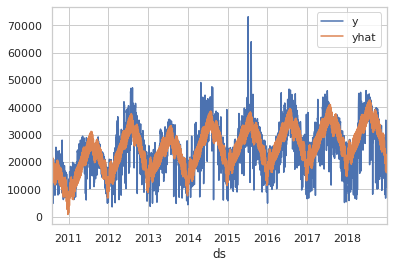

In [136]:

pd.concat([base_dataset.set_index('ds')['y'], forcast.set_index('ds')['yhat']], axis = 1).plot()

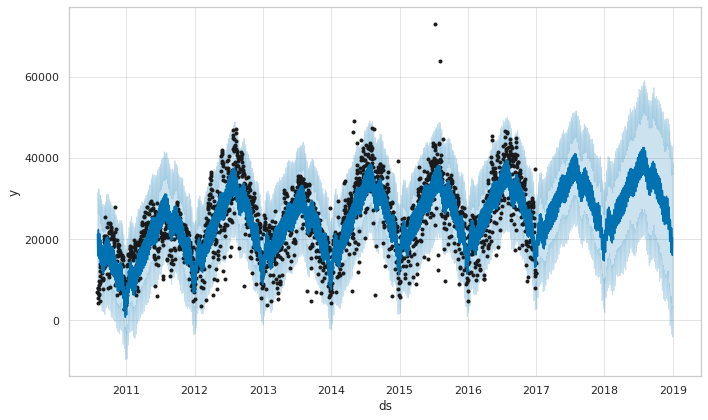

In [137]:
# use facebook prophet original plot function to do it better... we see that the actual value fall into the  95% confidence interval 
fig1 = m.plot(forcast)

From this above plot we see data fits with the model well. the black dots are actual data and deep blue is prediction from model. Though the match but at some days there were higher number of hires may be due to good temperature in london. the model could not detect this outlayers. so in next iteration we will deal with this and add temperature for better predictions.

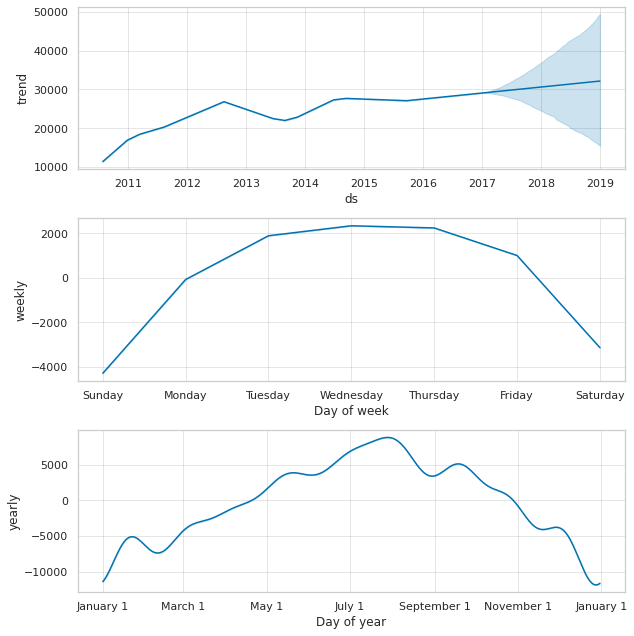

In [138]:
fig2 = m.plot_components(forcast)

We see that May to October the bike hire is highest. This is beacause summer months

 Now we add the change points 

In [139]:
from prophet.plot import add_changepoints_to_plot

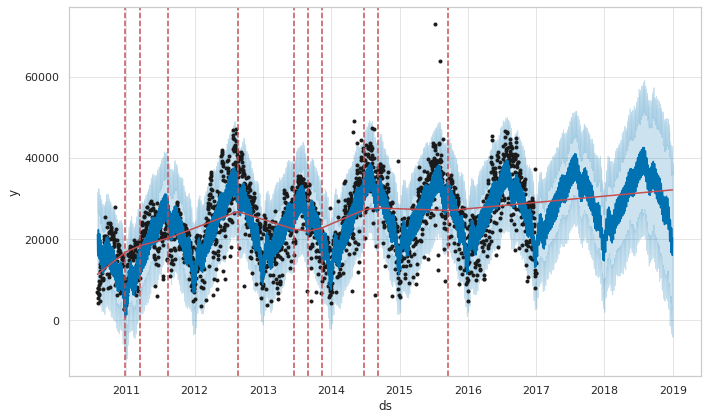

In [140]:
fig = m.plot(forcast)
a = add_changepoints_to_plot(fig.gca(), m, forcast)

To see if a negative or positive change happen and when we may plot change points 

In [141]:
deltas = m.params['delta'].mean(0)
deltas

array([-3.36163231e-06, -5.16021162e-01, -2.65502470e-01,  2.35611209e-07,
        1.77701814e-01,  8.55981177e-05, -2.42639606e-08,  4.69665601e-08,
       -1.95937140e-07, -1.03044089e+00, -2.01011291e-07, -1.08331490e-07,
        1.89739805e-04,  2.43125059e-01,  5.68510094e-01,  2.91867539e-01,
        1.10050956e-07, -2.09850519e-07, -4.65911136e-01, -2.27076111e-01,
       -9.84727493e-08, -9.61586624e-08,  1.76333825e-07,  6.51136973e-06,
        1.88389783e-01])

In [142]:
import matplotlib.pyplot as plt

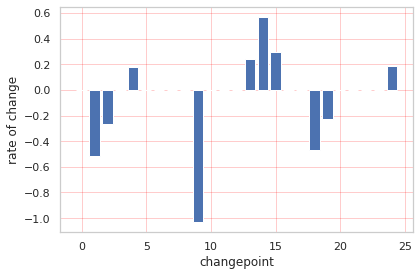

In [143]:
fig = plt.figure(facecolor = 'w')
ax = fig.add_subplot(111)
ax.bar(range(len(deltas)), deltas)
ax.grid(True, which = 'major', c = 'red', ls = '-', alpha = 0.2)
ax.set_xlabel('changepoint')
ax.set_ylabel('rate of change')
fig.tight_layout()

In [144]:
m.changepoints

75     2010-10-13
150    2010-12-27
225    2011-03-12
300    2011-05-26
375    2011-08-09
450    2011-10-23
525    2012-01-06
600    2012-03-21
675    2012-06-04
750    2012-08-18
825    2012-11-01
900    2013-01-15
976    2013-04-01
1051   2013-06-15
1126   2013-08-29
1201   2013-11-12
1276   2014-01-26
1351   2014-04-11
1426   2014-06-25
1501   2014-09-08
1576   2014-11-22
1651   2015-02-05
1726   2015-04-21
1801   2015-07-05
1876   2015-09-18
Name: ds, dtype: datetime64[ns]

#### Use facebook default plotting for interactive plots

In [145]:
from prophet.plot import plot_plotly
import plotly.offline as py
fig = plot_plotly(m, forcast)
py.iplot(fig)
# this code did not work due to the problem in ipwidgets

# Cross validation and see the performances of the model

I am telling the model that take initial 731 days to make prediction  of next 365 days

In [146]:
from prophet.diagnostics import cross_validation
cv_results = cross_validation(model = m, initial='731 days', horizon = '365 days')

INFO:prophet:Making 7 forecasts with cutoffs between 2013-01-01 00:00:00 and 2016-01-01 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

In [147]:
cv_results

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2013-01-02,18520.431830,10241.580787,27710.729196,16203,2013-01-01
1,2013-01-03,18415.484756,9470.973084,26889.245191,21269,2013-01-01
2,2013-01-04,18380.076639,10006.738129,26861.797836,22435,2013-01-01
3,2013-01-05,14297.516877,5682.903716,22632.334210,16242,2013-01-01
4,2013-01-06,12868.392015,4461.469109,20966.377729,13622,2013-01-01
...,...,...,...,...,...,...
2550,2016-12-27,16130.112934,3988.177026,28603.613231,11003,2016-01-01
2551,2016-12-28,16615.154606,5694.675682,29746.034772,12530,2016-01-01
2552,2016-12-29,16511.728735,3847.090176,29693.104646,14206,2016-01-01
2553,2016-12-30,15546.157261,2855.200700,28622.313884,11684,2016-01-01


In [148]:
cv_results.head(10)

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2013-01-02,18520.431830,10241.580787,27710.729196,16203,2013-01-01
1,2013-01-03,18415.484756,9470.973084,26889.245191,21269,2013-01-01
2,2013-01-04,18380.076639,10006.738129,26861.797836,22435,2013-01-01
3,2013-01-05,14297.516877,5682.903716,22632.334210,16242,2013-01-01
4,2013-01-06,12868.392015,4461.469109,20966.377729,13622,2013-01-01
5,2013-01-07,18348.011503,8898.641440,27190.163713,23348,2013-01-01
6,2013-01-08,20424.074414,11830.286811,29244.580067,25909,2013-01-01
7,2013-01-09,21402.408550,12537.438709,30632.733402,25341,2013-01-01
8,2013-01-10,21400.543031,11692.973282,30591.404574,24363,2013-01-01
9,2013-01-11,21427.685163,13010.325986,30042.780929,23869,2013-01-01


 see the performance using performance metrics

In [149]:
from prophet.diagnostics import performance_metrics
performance = performance_metrics(cv_results)
performance

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days 12:00:00,4.358843e+07,6602.153425,5090.135790,0.238936,0.177102,0.219098,0.878431
1,37 days 00:00:00,4.354734e+07,6599.040867,5073.638090,0.239907,0.177274,0.219827,0.878431
2,37 days 12:00:00,4.488757e+07,6699.818728,5140.530669,0.238248,0.177102,0.219342,0.870588
3,38 days 00:00:00,4.434754e+07,6659.394532,5078.415432,0.234840,0.173154,0.217158,0.871569
4,38 days 12:00:00,4.417755e+07,6646.619203,5075.484283,0.226815,0.173154,0.213591,0.874510
...,...,...,...,...,...,...,...,...
653,363 days 00:00:00,1.130395e+08,10632.003694,8346.365766,0.376145,0.297248,0.412236,0.727451
654,363 days 12:00:00,1.136268e+08,10659.589564,8323.214301,0.372396,0.294620,0.409847,0.729412
655,364 days 00:00:00,1.144318e+08,10697.278468,8379.361957,0.380489,0.297353,0.415782,0.725490
656,364 days 12:00:00,1.161010e+08,10775.017227,8435.773957,0.380877,0.297353,0.416755,0.721569


# Bring temperature data to make better prediction

We want to plug the temperature of london to which might influence the bike hiring so we found a dataset of waether from  Kaggle. Cleaned it only for london. Now we will further clean it to comply with our bike hiring dataset.

In [150]:
temperature = pd.read_csv('london_temperature_profile.csv')

In [151]:
temperature

,datetime,London
0,1980-01-01,-1.68
1,1980-01-02,-1.99
2,1980-01-03,2.18
3,1980-01-04,6.96
4,1980-01-05,4.14
...,...,...
14879,2020-09-26,9.75
14880,2020-09-27,11.44
14881,2020-09-28,12.64
14882,2020-09-29,14.38


In [152]:
# we update original bike hiring dataset to match the availabe temperature 
bike_hiring_updated = bikehiring_from_2010[bikehiring_from_2010['ds'] <= '2020-09-30']
bike_hiring_updated

,ds,y,on_season,off_season
0,2010-07-30,6897,True,False
1,2010-07-31,5564,True,False
2,2010-08-01,4303,True,False
3,2010-08-02,6642,True,False
4,2010-08-03,7966,True,False
...,...,...,...,...
3711,2020-09-26,34352,True,False
3712,2020-09-27,26694,True,False
3713,2020-09-28,33146,True,False
3714,2020-09-29,32116,True,False


In [153]:
print(bike_hiring_updated.ds.min())
print(bike_hiring_updated.ds.max())

2010-07-30 00:00:00
2020-09-30 00:00:00


In [154]:
temperature_updated = temperature[(temperature['datetime'] >= '2010-07-30') & (temperature['datetime'] <= '2021-09-30')].reset_index(drop = True)

In [155]:
temperature_updated.shape

(3716, 2)

In [156]:
 # now we are sure both bike_hiring_updated and temperature dataframe match
temperature_updated

,datetime,London
0,2010-07-30,17.21
1,2010-07-31,19.26
2,2010-08-01,17.66
3,2010-08-02,17.45
4,2010-08-03,17.45
...,...,...
3711,2020-09-26,9.75
3712,2020-09-27,11.44
3713,2020-09-28,12.64
3714,2020-09-29,14.38


In [157]:
bike_hiring_updated['Temperature'] = temperature_updated.loc[:, ('London')]

/opt/conda/envs/rapids/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [158]:
bike_hiring_updated


,ds,y,on_season,off_season,Temperature
0,2010-07-30,6897,True,False,17.21
1,2010-07-31,5564,True,False,19.26
2,2010-08-01,4303,True,False,17.66
3,2010-08-02,6642,True,False,17.45
4,2010-08-03,7966,True,False,17.45
...,...,...,...,...,...
3711,2020-09-26,34352,True,False,9.75
3712,2020-09-27,26694,True,False,11.44
3713,2020-09-28,33146,True,False,12.64
3714,2020-09-29,32116,True,False,14.38


In [159]:
bike_hiring_updated.dtypes

ds             datetime64[ns]
y                       int64
on_season                bool
off_season               bool
Temperature           float64
dtype: object

Facebook prophet can not handle missing values in temperature column. So we check it before, impute if necessary. we do it by using temperature != temperature. This logic is only true when there is a nan in the raw. As nan can not be equal to nan.

In [160]:
bike_hiring_updated.query( 'Temperature != Temperature') # as we see here there is no nan in this column

,ds,y,on_season,off_season,Temperature


We already know the covid situation affected the bike hiring than usual in 2020. For the sake of simplicity for now we focus our analysis  to the end of 2019

In [161]:
bike_hiring_updated = bike_hiring_updated[bike_hiring_updated['ds'].dt.year < 2020 ].copy()

We want add a column to the data frame which will indicate if the date is holiday or not. For this we installed a library called holidays. It takes the input as python date time and says if the day is holiday or not. But date object we have is in pandas timestamp format. So we again convert it to python datetime and plud into holiday function

In [162]:
uk_holidays = holidays.UK()

In [163]:
bike_hiring_updated.ds[0].to_pydatetime() in uk_holidays

False

In [164]:
bike_hiring_updated['holiday'] =bike_hiring_updated.ds.apply(lambda row: row.to_pydatetime() in uk_holidays)

In [165]:
bike_hiring_updated.dtypes

ds             datetime64[ns]
y                       int64
on_season                bool
off_season               bool
Temperature           float64
holiday                  bool
dtype: object

Let's take the months in a seperated column from the time stamp

In [166]:
bike_hiring_updated['month'] = bike_hiring_updated.ds.dt.month

In [167]:
bike_hiring_updated['day-of-week'] = bike_hiring_updated['ds'].dt.day_name()

In [168]:
bike_hiring_updated

,ds,y,on_season,off_season,Temperature,holiday,month,day-of-week
0,2010-07-30,6897,True,False,17.21,False,7,Friday
1,2010-07-31,5564,True,False,19.26,False,7,Saturday
2,2010-08-01,4303,True,False,17.66,False,8,Sunday
3,2010-08-02,6642,True,False,17.45,True,8,Monday
4,2010-08-03,7966,True,False,17.45,False,8,Tuesday
...,...,...,...,...,...,...,...,...
3437,2019-12-27,11718,True,False,6.81,False,12,Friday
3438,2019-12-28,11414,True,False,7.24,False,12,Saturday
3439,2019-12-29,12256,True,False,6.45,False,12,Sunday
3440,2019-12-30,16166,True,False,5.67,False,12,Monday


In [169]:
bike_hiring_updated['log_y'] = np.log(bike_hiring_updated.y)

In [170]:
bike_hiring_updated.hvplot.line(x='ds', y= 'log_y')

:Curve   [ds]   (log_y)

In [171]:
bike_hiring_updated.hvplot.line(x='ds', y= 'y', 
                                hover_cols = ['ds','day-of-week','on_season','off_season','Temperature', 'y', 'holiday'], 
                                title= 'YEARLY BIKE HIRING IN LONDON')

:Curve   [ds]   (y,day-of-week,on_season,off_season,Temperature,holiday)

In [172]:
bike_hiring_updated.hvplot.line(x='ds', y= 'Temperature', title= 'Temperature Profile in London')

:Curve   [ds]   (Temperature)

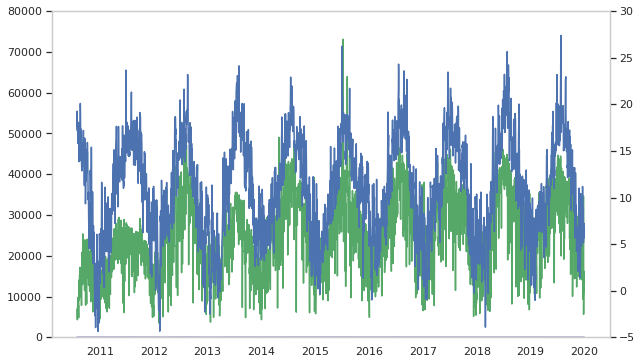

In [173]:
# Add both graphs together to see the temperature effect on bike hiring
df = bike_hiring_updated.copy()
X = df[['ds']]
Y1=df[['y']]
Y2=df[['Temperature']]

fig, ax1 = plt.subplots(figsize=(10,6))
ax2 = ax1.twinx()

ax1.plot(X, Y1, 'g', label='y') #plotting on primary Y-axis
ax1.plot(X, Y2, 'm', label='Temp') #plotting on primary Y-axis

ax2.plot(X, Y2, 'b', label='Temp') #plotting on **second** Y-axis

ax1.set_ylim(0, 80000) #Define limit/scale for primary Y-axis
ax2.set_ylim(-5, 30) #Define limit/scale for secondary Y-axis
ax1.grid(False)
ax2.grid(False)

plt.show()

Before feature engineering by temperature let's checke correlation between temperature and bike hiring

It seems 60% correlation  between temperature and bike hiring

In [174]:
bike_hiring_updated[['y','Temperature']].corr()

,y,Temperature
y,1.000000,0.621884
Temperature,0.621884,1.000000


Let's check correlation improves if we feed temperature greater or less than 15 degrees

In [175]:
bike_hiring_updated.query('Temperature >= 10')[['y','Temperature']].corr()
# It did not improve the correlation

,y,Temperature
y,1.000000,0.458692
Temperature,0.458692,1.000000


Define a function when temperature is more than 10 it gives 1 and less than 10 it gives 0

In [176]:
def summer_temp(temp):
    if temp >= 10:
        return 1
    else:
        return 0

In [177]:
bike_hiring_updated['summer_temp'] = bike_hiring_updated.Temperature.apply(summer_temp)

In [178]:
bike_hiring_updated

,ds,y,on_season,off_season,Temperature,holiday,month,day-of-week,log_y,summer_temp
0,2010-07-30,6897,True,False,17.21,False,7,Friday,8.838842,1
1,2010-07-31,5564,True,False,19.26,False,7,Saturday,8.624073,1
2,2010-08-01,4303,True,False,17.66,False,8,Sunday,8.367068,1
3,2010-08-02,6642,True,False,17.45,True,8,Monday,8.801168,1
4,2010-08-03,7966,True,False,17.45,False,8,Tuesday,8.982938,1
...,...,...,...,...,...,...,...,...,...,...
3437,2019-12-27,11718,True,False,6.81,False,12,Friday,9.368881,0
3438,2019-12-28,11414,True,False,7.24,False,12,Saturday,9.342596,0
3439,2019-12-29,12256,True,False,6.45,False,12,Sunday,9.413771,0
3440,2019-12-30,16166,True,False,5.67,False,12,Monday,9.690666,0


To track the behavior in summer or winter better we cut the months in 4 bins

In [179]:
def seasons(month):
    if (month >= 3) and (month <= 5): # for spring
        return 1
    elif month >= 6 and month <= 8:
        return 2
    elif month >= 9 and month <= 11:
        return 3
    else:
        return 4

In [180]:
seasons(12)

4

In [181]:
bike_hiring_updated['month_bin'] = bike_hiring_updated.month.apply(lambda raw: seasons(raw))

In [182]:
bike_hiring_updated

,ds,y,on_season,off_season,Temperature,holiday,month,day-of-week,log_y,summer_temp,month_bin
0,2010-07-30,6897,True,False,17.21,False,7,Friday,8.838842,1,2
1,2010-07-31,5564,True,False,19.26,False,7,Saturday,8.624073,1,2
2,2010-08-01,4303,True,False,17.66,False,8,Sunday,8.367068,1,2
3,2010-08-02,6642,True,False,17.45,True,8,Monday,8.801168,1,2
4,2010-08-03,7966,True,False,17.45,False,8,Tuesday,8.982938,1,2
...,...,...,...,...,...,...,...,...,...,...,...
3437,2019-12-27,11718,True,False,6.81,False,12,Friday,9.368881,0,4
3438,2019-12-28,11414,True,False,7.24,False,12,Saturday,9.342596,0,4
3439,2019-12-29,12256,True,False,6.45,False,12,Sunday,9.413771,0,4
3440,2019-12-30,16166,True,False,5.67,False,12,Monday,9.690666,0,4


In [183]:
bike_hiring_updated1 = bike_hiring_updated[['ds','y','summer_temp', 'month_bin']]

### Train test split
we can not use usual train test split like scikit. we do it just by spliting the dataset by time


In [184]:
train = bike_hiring_updated1[bike_hiring_updated1.ds.dt.year < 2018]

In [185]:
train

,ds,y,summer_temp,month_bin
0,2010-07-30,6897,1,2
1,2010-07-31,5564,1,2
2,2010-08-01,4303,1,2
3,2010-08-02,6642,1,2
4,2010-08-03,7966,1,2
...,...,...,...,...
2707,2017-12-27,5426,0,4
2708,2017-12-28,11236,0,4
2709,2017-12-29,8346,0,4
2710,2017-12-30,10908,1,4


In [186]:
test = bike_hiring_updated1[bike_hiring_updated1.ds.dt.year >= 2018]

In [187]:
test

,ds,y,summer_temp,month_bin
2712,2018-01-01,10235,0,4
2713,2018-01-02,14394,0,4
2714,2018-01-03,20265,0,4
2715,2018-01-04,17543,0,4
2716,2018-01-05,21759,0,4
...,...,...,...,...
3437,2019-12-27,11718,0,4
3438,2019-12-28,11414,0,4
3439,2019-12-29,12256,0,4
3440,2019-12-30,16166,0,4


# Train the model
Our data clearly has yearly seasonality so we put it true

In [188]:
m = Prophet(interval_width= 0.95, yearly_seasonality= True)

now we tell the model that it should take summer temperature in consideration, but not standerdize

In [189]:
m.add_regressor('summer_temp', standardize= False)
m.add_regressor('month_bin', mode = 'multiplicative')

In [190]:
m.fit(train)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [191]:
m.params

{'k': array([[0.99400897]]),
 'm': array([[0.14896156]]),
 'delta': array([[-1.70111252e-04, -3.62163374e-01, -8.74091360e-07,
          3.56743564e-07,  2.91392519e-06,  8.12254805e-08,
         -6.80893335e-08, -3.59905608e-01, -7.96739547e-01,
         -1.48945031e-07,  4.06098777e-08,  3.47932172e-01,
          6.01904264e-01,  1.61667394e-01,  3.82778825e-08,
         -8.98222665e-08, -5.85402254e-01, -9.08809016e-09,
          3.17066433e-07,  1.16518438e-07,  5.54130650e-03,
          3.45954486e-02,  3.25580048e-02,  1.45507988e-07,
         -6.15548977e-07]]),
 'sigma_obs': array([[0.0717071]]),
 'beta': array([[-2.47306965e-02, -7.05029071e-02,  5.10391357e-03,
         -5.12064135e-03,  2.82289102e-03, -1.41929247e-02,
          8.65293282e-03, -3.84897156e-04, -2.64024359e-03,
         -7.58604824e-03,  7.29143111e-03, -9.40214584e-03,
          4.58874845e-03, -5.60833218e-03,  2.43359090e-03,
         -5.68634568e-03,  7.31135997e-03, -7.61254977e-03,
          2.96131152

Now we create our future dataframe. It must contain ds, summer temp and month bin as we are predicting based on this

In [192]:
future = m.make_future_dataframe(periods = 730)

In [193]:
future.tail()

,ds
3437,2019-12-27
3438,2019-12-28
3439,2019-12-29
3440,2019-12-30
3441,2019-12-31


In [194]:
future['month_bin'] = bike_hiring_updated1['month_bin']

In [195]:
future['summer_temp'] = bike_hiring_updated1['summer_temp']

In [196]:
future

,ds,month_bin,summer_temp
0,2010-07-30,2,1
1,2010-07-31,2,1
2,2010-08-01,2,1
3,2010-08-02,2,1
4,2010-08-03,2,1
...,...,...,...
3437,2019-12-27,4,0
3438,2019-12-28,4,0
3439,2019-12-29,4,0
3440,2019-12-30,4,0


now we forcast future

In [197]:
forcast = m.predict(future)

In [198]:
comparision = forcast[['ds','yhat']].tail(730)

In [199]:
comparision['y_true'] = test.y

In [200]:
comparision.reset_index(drop = True)

,ds,yhat,y_true
0,2018-01-01,16987.107490,10235
1,2018-01-02,19155.265486,14394
2,2018-01-03,19760.402496,20265
3,2018-01-04,20126.900327,17543
4,2018-01-05,19275.138088,21759
...,...,...,...
725,2019-12-27,18686.387682,11718
726,2019-12-28,14389.775266,11414
727,2019-12-29,13269.320009,12256
728,2019-12-30,17883.409232,16166


In [201]:
comparision.hvplot.line(x='ds', y= ['y_true','yhat'], hover ='all', title= 'Comparision between true and predicted value')

:NdOverlay   [Variable]
   :Curve   [ds]   (value)

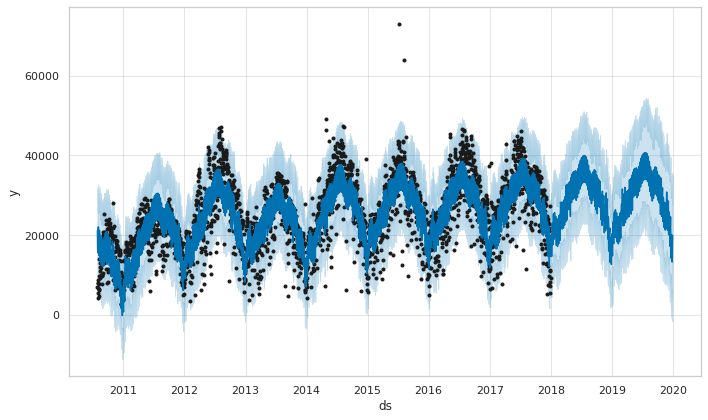

In [202]:
# We can do comparision by using plot function in prophet
fig1 = m.plot(forcast)

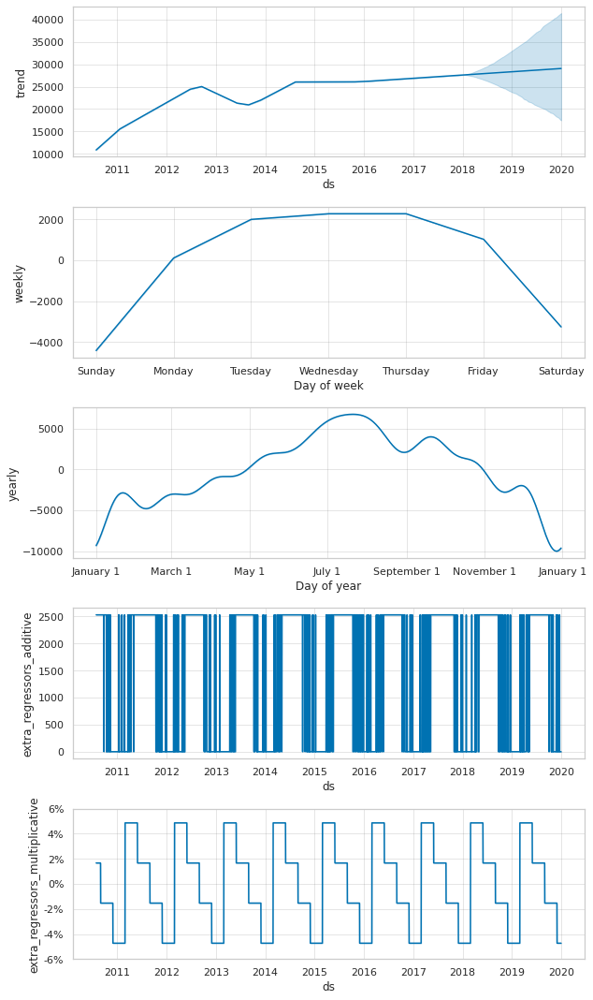

In [203]:
fig2 = m.plot_components(forcast)

### Crossvalidation

In [204]:
from prophet.diagnostics import cross_validation, performance_metrics
cv_results = cross_validation(model = m, initial= '731 days', horizon = '365 days')
performance = performance_metrics(cv_results)
performance

INFO:prophet:Making 9 forecasts with cutoffs between 2013-01-01 00:00:00 and 2016-12-31 00:00:00


  0%|          | 0/9 [00:00<?, ?it/s]

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days 12:00:00,4.147864e+07,6440.390988,4954.779947,0.223989,0.161976,0.207033,0.881098
1,37 days 00:00:00,4.140282e+07,6434.501984,4943.629105,0.224491,0.161976,0.207543,0.881098
2,37 days 12:00:00,4.251279e+07,6520.182911,4998.165035,0.221390,0.161052,0.206069,0.875000
3,38 days 00:00:00,4.205093e+07,6484.668917,4943.406408,0.218985,0.158681,0.204314,0.875610
4,38 days 12:00:00,4.192288e+07,6474.787902,4939.097804,0.211993,0.158681,0.200751,0.878049
...,...,...,...,...,...,...,...,...
653,363 days 00:00:00,1.019545e+08,10097.251562,8026.749247,0.387060,0.280096,0.385955,0.751220
654,363 days 12:00:00,1.023504e+08,10116.837228,8011.671005,0.383659,0.278408,0.383893,0.753049
655,364 days 00:00:00,1.026824e+08,10133.233036,8040.900020,0.391077,0.280096,0.388952,0.750000
656,364 days 12:00:00,1.039222e+08,10194.224489,8084.737399,0.391158,0.279020,0.389567,0.746951


We find Mape 0.4 from this model

The mean absolute percent error (MAPE) expresses accuracy as a percentage of the error. Because the MAPE is a percentage, it can be easier to understand than the other accuracy measure statistics. For example, if the MAPE is 5, on average, the forecast is off by 5%.

However, sometimes you may see a very large value of MAPE even though the model appears to fit the data well. Examine the plot to see if any data values are close to 0. Because MAPE divides the absolute error by the actual data, values close to 0 can greatly inflate the MAPE.

In [205]:
from prophet.plot import plot_cross_validation_metric

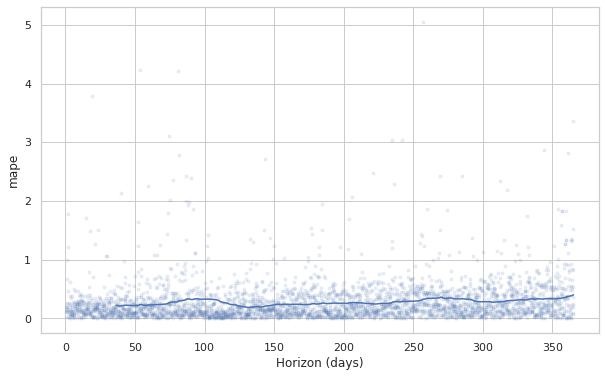

In [206]:
fig3 = plot_cross_validation_metric(cv_results, metric = 'mape')

# Add holiday feature again


In [207]:
m = Prophet(interval_width= 0.95, yearly_seasonality= True)

In [208]:
m.add_country_holidays(country_name='UK')

In [209]:
m.add_regressor('summer_temp', standardize= False)
m.add_regressor('month_bin', mode = 'multiplicative')

In [210]:
m.fit(train)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [211]:
future = m.make_future_dataframe(periods = 730)

In [212]:
future['month_bin'] = bike_hiring_updated1['month_bin']
future['summer_temp'] = bike_hiring_updated1['summer_temp']

In [213]:
forcast = m.predict(future)

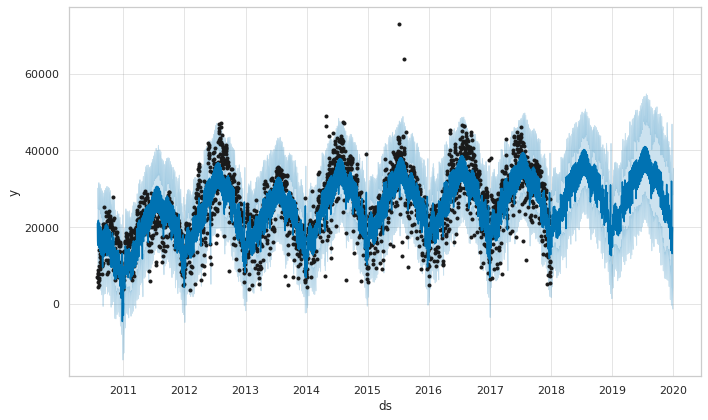

In [214]:
fig1 = m.plot(forcast)

In [215]:
# Cross validation again
from prophet.diagnostics import cross_validation, performance_metrics
cv_results = cross_validation(model = m, initial= '731 days', horizon = '365 days')
performance = performance_metrics(cv_results)
performance


INFO:prophet:Making 9 forecasts with cutoffs between 2013-01-01 00:00:00 and 2016-12-31 00:00:00


  0%|          | 0/9 [00:00<?, ?it/s]

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days 12:00:00,4.060444e+07,6372.161184,4854.740327,0.216943,0.155910,0.201998,0.868902
1,37 days 00:00:00,4.050893e+07,6364.662963,4838.051259,0.217455,0.155910,0.202386,0.868902
2,37 days 12:00:00,4.158685e+07,6448.786561,4893.462326,0.215591,0.155170,0.201537,0.862805
3,38 days 00:00:00,4.110166e+07,6411.057750,4834.281105,0.213024,0.152551,0.199605,0.863415
4,38 days 12:00:00,4.099870e+07,6403.023077,4831.611466,0.206270,0.152551,0.196205,0.865854
...,...,...,...,...,...,...,...,...
653,363 days 00:00:00,9.705532e+07,9851.665836,7785.254866,0.368069,0.268682,0.372774,0.751220
654,363 days 12:00:00,9.763006e+07,9880.792317,7776.281742,0.365119,0.260454,0.371049,0.753049
655,364 days 00:00:00,9.792918e+07,9895.917194,7813.497940,0.373113,0.270221,0.376733,0.750000
656,364 days 12:00:00,9.930489e+07,9965.184134,7864.544753,0.373455,0.268682,0.377634,0.746951


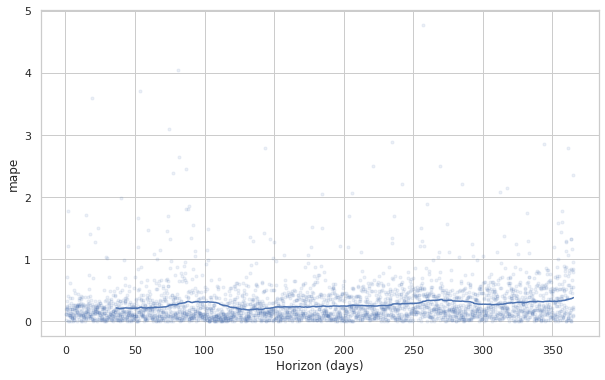

In [216]:
fig3 = plot_cross_validation_metric(cv_results, metric = 'mape')

# Do the multivariatev analysis with temperature


In [217]:
bike_hiring_updated

,ds,y,on_season,off_season,Temperature,holiday,month,day-of-week,log_y,summer_temp,month_bin
0,2010-07-30,6897,True,False,17.21,False,7,Friday,8.838842,1,2
1,2010-07-31,5564,True,False,19.26,False,7,Saturday,8.624073,1,2
2,2010-08-01,4303,True,False,17.66,False,8,Sunday,8.367068,1,2
3,2010-08-02,6642,True,False,17.45,True,8,Monday,8.801168,1,2
4,2010-08-03,7966,True,False,17.45,False,8,Tuesday,8.982938,1,2
...,...,...,...,...,...,...,...,...,...,...,...
3437,2019-12-27,11718,True,False,6.81,False,12,Friday,9.368881,0,4
3438,2019-12-28,11414,True,False,7.24,False,12,Saturday,9.342596,0,4
3439,2019-12-29,12256,True,False,6.45,False,12,Sunday,9.413771,0,4
3440,2019-12-30,16166,True,False,5.67,False,12,Monday,9.690666,0,4


In [218]:
bike_hiring_updated['log_y'] = np.log(bike_hiring_updated.y)

In [219]:
bike_hiring_updated

,ds,y,on_season,off_season,Temperature,holiday,month,day-of-week,log_y,summer_temp,month_bin
0,2010-07-30,6897,True,False,17.21,False,7,Friday,8.838842,1,2
1,2010-07-31,5564,True,False,19.26,False,7,Saturday,8.624073,1,2
2,2010-08-01,4303,True,False,17.66,False,8,Sunday,8.367068,1,2
3,2010-08-02,6642,True,False,17.45,True,8,Monday,8.801168,1,2
4,2010-08-03,7966,True,False,17.45,False,8,Tuesday,8.982938,1,2
...,...,...,...,...,...,...,...,...,...,...,...
3437,2019-12-27,11718,True,False,6.81,False,12,Friday,9.368881,0,4
3438,2019-12-28,11414,True,False,7.24,False,12,Saturday,9.342596,0,4
3439,2019-12-29,12256,True,False,6.45,False,12,Sunday,9.413771,0,4
3440,2019-12-30,16166,True,False,5.67,False,12,Monday,9.690666,0,4


In [220]:
train = bike_hiring_updated[bike_hiring_updated.ds.dt.year <2018][['ds', 'y','Temperature']]

In [221]:
#train.columns = ['ds', 'y','Temperature']

In [222]:
test = bike_hiring_updated[bike_hiring_updated.ds.dt.year >= 2018][['ds', 'y','Temperature']]

In [223]:
#test.columns = ['ds', 'y','Temperature']

In [224]:
m = Prophet(interval_width= 0.95, yearly_seasonality= True)

In [225]:
m.add_regressor('Temperature', standardize= False)

In [226]:
m.fit(train)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [227]:
future = m.make_future_dataframe(periods = 730)

In [228]:
future['Temperature'] = bike_hiring_updated['Temperature']

In [229]:
future

,ds,Temperature
0,2010-07-30,17.21
1,2010-07-31,19.26
2,2010-08-01,17.66
3,2010-08-02,17.45
4,2010-08-03,17.45
...,...,...
3437,2019-12-27,6.81
3438,2019-12-28,7.24
3439,2019-12-29,6.45
3440,2019-12-30,5.67


In [230]:
forcast = m.predict(future)

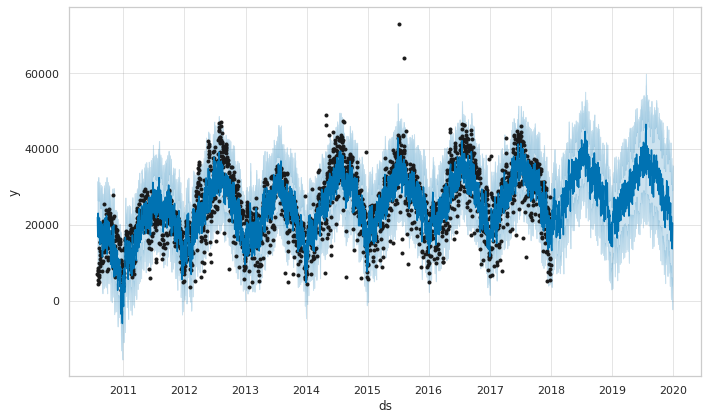

In [231]:
fig1 = m.plot(forcast)

# Covid Cases UK 

In [232]:
covid = pd.read_csv('covid_cases_uk.csv')

In [233]:
covid

,areaCode,areaName,areaType,date,newCasesByPublishDateChange
0,K02000001,United Kingdom,overview,2021-12-01,2181
1,K02000001,United Kingdom,overview,2021-11-30,2896
2,K02000001,United Kingdom,overview,2021-11-29,10905
3,K02000001,United Kingdom,overview,2021-11-28,18451
4,K02000001,United Kingdom,overview,2021-11-27,24261
...,...,...,...,...,...
660,K02000001,United Kingdom,overview,2020-02-10,6
661,K02000001,United Kingdom,overview,2020-02-09,2
662,K02000001,United Kingdom,overview,2020-02-08,1
663,K02000001,United Kingdom,overview,2020-02-07,1


In [234]:
covid = covid[['date', 'newCasesByPublishDateChange']]

In [235]:
covid.rename(columns ={'newCasesByPublishDateChange' : 'incident'}, inplace = True)

/opt/conda/envs/rapids/lib/python3.7/site-packages/pandas/core/frame.py:4449: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [236]:
covid.date.min()

'2020-02-06'

In [237]:
covid.date.max()

'2021-12-01'

In [238]:
covid = covid[covid.date <= '2020-09-30']

In [239]:
covid.tail(100)

,date,incident
565,2020-05-15,-8563
566,2020-05-14,-9026
567,2020-05-13,-7276
568,2020-05-12,-2372
569,2020-05-11,-959
...,...,...
660,2020-02-10,6
661,2020-02-09,2
662,2020-02-08,1
663,2020-02-07,1


In [240]:
covid.hvplot(x= 'date', y = 'incident')


:Curve   [date]   (incident)

In [241]:
bike_covid = bikehiring_from_2010[bikehiring_from_2010.ds >= '2020-02-06']
bike_covid 

,ds,y,on_season,off_season
3478,2020-02-06,29481,True,False
3479,2020-02-07,28238,True,False
3480,2020-02-08,21810,True,False
3481,2020-02-09,6479,True,False
3482,2020-02-10,21873,True,False
...,...,...,...,...
4076,2021-09-26,45120,True,False
4077,2021-09-27,32167,True,False
4078,2021-09-28,32539,True,False
4079,2021-09-29,39889,True,False


In [242]:
temperature

,datetime,London
0,1980-01-01,-1.68
1,1980-01-02,-1.99
2,1980-01-03,2.18
3,1980-01-04,6.96
4,1980-01-05,4.14
...,...,...
14879,2020-09-26,9.75
14880,2020-09-27,11.44
14881,2020-09-28,12.64
14882,2020-09-29,14.38
